# Capstone Three - Data Wrangling and EDA

In the final capstone for the Springboard project we are going to take another look at the second capstone; predicting monthly airbnb booking is going to be at least %50 or not. In our last capstone we were able to achieve decent accuracy, however there definitely could be some improvement. For this project we are going to be utilizing a classifier instead of linear regression to be able to predict our airbnb booking. We will be utilizing the use deep learning (tensorflow) to do this binary classifcation problem. In theory neural networks will usually perform better but they are prone to overfitting, so let's try it out. This time around since we are using deep learning technologies we will now explore the data a little differently and add more features for our neural network.

In [229]:
#Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import json
from collections import Counter
import time
import datetime

#Stats library
from scipy.stats import ttest_ind

from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import nltk
from fuzzywuzzy import fuzz

In [230]:
#set default visualization style to seaborn
sns.set()

In [231]:
pd.set_option('display.max_rows', 500)

In [232]:
pd.set_option('display.max_columns', None)

## Data Wrangling

In this section we are going to be going through the data and ensuring we are in a good format to then perform some analysis on. This requires some cleaning and a little feature engineering.

In [233]:
#Read the data
df = pd.read_csv("../assets/data/orig/listings.csv")
df.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,5456,https://www.airbnb.com/rooms/5456,20220312074014,2022-03-13,"Walk to 6th, Rainey St and Convention Ctr",Great central location for walking to Convent...,My neighborhood is ideally located if you want...,https://a0.muscache.com/pictures/14084884/b5a3...,8028,https://www.airbnb.com/users/show/8028,Sylvia,2009-02-16,"Austin, Texas, United States",I am a licensed Real Estate Broker and owner o...,within an hour,100%,94%,t,https://a0.muscache.com/im/users/8028/profile_...,https://a0.muscache.com/im/users/8028/profile_...,East Downtown,1.0,1.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Austin, Texas, United States",78702,NaN,30.26057,-97.73441,Entire guesthouse,Entire home/apt,3,NaN,1 bath,1.0,2.0,"[""Patio or balcony"", ""Hair dryer"", ""Security c...",$240.00,2,90,2.0,3.0,90.0,90.0,2.0,90.0,NaN,t,7,18,44,305,2022-03-13,585,42,5,2009-03-08,2022-03-07,4.83,4.87,4.85,4.89,4.81,4.73,4.78,NaN,f,1,1,0,0,3.69
1,5769,https://www.airbnb.com/rooms/5769,20220312074014,2022-03-31,NW Austin Room,<b>The space</b><br />Looking for a comfortabl...,Quiet neighborhood with lots of trees and good...,https://a0.muscache.com/pictures/23822033/ac94...,8186,https://www.airbnb.com/users/show/8186,Elizabeth,2009-02-19,"Austin, Texas, United States",We're easygoing professionals that enjoy meeti...,NaN,NaN,100%,t,https://a0.muscache.com/im/users/8186/profile_...,https://a0.muscache.com/im/users/8186/profile_...,SW Williamson Co.,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"Austin, Texas, United States",78729,NaN,30.45697,-97.78422,Private room in home,Private room,2,NaN,1 shared bath,1.0,1.0,"[""Essentials"", ""Hair dryer"", ""Hot water"", ""Hea...",$42.00,1,14,1.0,1.0,14.0,14.0,1.0,14.0,NaN,t,0,0,0,0,2022-03-31,264,3,0,2010-04-10,2021-07-03,4.90,4.90,4.86,4.91,4.94,4.74,4.92,NaN,f,1,0,1,0,1.81
2,6413,https://www.airbnb.com/rooms/6413,20220312074014,2022-03-31,Gem of a Studio near Downtown,"Great studio apartment, perfect a single perso...",Travis Heights is one of the oldest neighborho...,https://a0.muscache.com/pictures/miso/Hosting-...,13879,https://www.airbnb.com/users/show/13879,Todd,2009-04-17,"Austin, Texas, United States","We're a young family that likes to travel, we ...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/4f35e...,https://a0.muscache.com/im/pictures/user/4f35e...,Travis Heights,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Austin, Texas, United States",78704,NaN,30.24885,-97.73587,Entire guesthouse,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Kitchen"", ""Microwave"", ""Stove"", ""Shampoo"", ""...",$109.00,3,365,3.0,3.0,1125.0,1125.0,3.0,1125.0,NaN,t,0,0,0,0,2022-03-31,117,2,0,20

Great we have the data imported the next thing we are going to do is check to see if there are any data that are null/corrupted and get a count in the dataframe

In [234]:
df.isna().sum()

id                                                  0
listing_url                                         0
scrape_id                                           0
last_scraped                                        0
name                                                0
description                                       164
neighborhood_overview                            4913
picture_url                                         1
host_id                                             0
host_url                                            0
host_name                                           3
host_since                                          3
host_location                                      18
host_about                                       4679
host_response_time                               3449
host_response_rate                               3449
host_acceptance_rate                             2862
host_is_superhost                                   3
host_thumbnail_url          

There seems to be a considerable amount of missing data from some of these columns. I think we can move in the right direction by first only selecting the columns that we will be using for our modeling.

In [235]:
list(df.columns)

['id',
 'listing_url',
 'scrape_id',
 'last_scraped',
 'name',
 'description',
 'neighborhood_overview',
 'picture_url',
 'host_id',
 'host_url',
 'host_name',
 'host_since',
 'host_location',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_thumbnail_url',
 'host_picture_url',
 'host_neighbourhood',
 'host_listings_count',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bathrooms_text',
 'bedrooms',
 'beds',
 'amenities',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'calendar_updated',
 'has_availability',
 'availability_30',
 'availa

In [236]:
selected_features = [
 'name',
 'description',
 'neighborhood_overview',
 'picture_url',
 'host_since',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_listings_count',
 'host_total_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood',
 'neighbourhood_cleansed',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms_text',
 'latitude',
 'longitude',
 'bedrooms',
 'beds',
 'amenities',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'instant_bookable',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'calculated_host_listings_count_shared_rooms',
 'reviews_per_month']
 
df_feature_subset = df[selected_features]
df_feature_subset.head()

,name,description,neighborhood_overview,picture_url,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,last_review,review_scores_rating,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,"Walk to 6th, Rainey St and Convention Ctr",Great central location for walking to Convent...,My neighborhood is ideally located if you want...,https://a0.muscache.com/pictures/14084884/b5a3...,2009-02-16,I am a licensed Real Estate Broker and owner o...,within an hour,100%,94%,t,1.0,1.0,t,t,"Austin, Texas, United States",78702,Entire guesthouse,Entire home/apt,3,1 bath,30.26057,-97.73441,1.0,2.0,"[""Patio or balcony"", ""Hair dryer"", ""Security c...",$240.00,2,90,2.0,3.0,90.0,90.0,2.0,90.0,t,7,18,44,305,585,42,5,2022-03-07,4.83,4.87,f,1,1,0,0,3.69
1,NW Austin Room,<b>The space</b><br />Looking for a comfortabl...,Quiet neighborhood with lots of trees and good...,https://a0.muscache.com/pictures/23822033/ac94...,2009-02-19,We're easygoing professionals that enjoy meeti...,NaN,NaN,100%,t,1.0,1.0,t,t,"Austin, Texas, United States",78729,Private room in home,Private room,2,1 shared bath,30.45697,-97.78422,1.0,1.0,"[""Essentials"", ""Hair dryer"", ""Hot water"", ""Hea...",$42.00,1,14,1.0,1.0,14.0,14.0,1.0,14.0,t,0,0,0,0,264,3,0,2021-07-03,4.90,4.90,f,1,0,1,0,1.81
2,Gem of a Studio near Downtown,"Great studio apartment, perfect a single perso...",Travis Heights is one of the oldest neighborho...,https://a0.muscache.com/pictures/miso/Hosting-...,2009-04-17,"We're a young family that likes to travel, we ...",within an hour,100%,100%,t,1.0,1.0,t,t,"Austin, Texas, United States",78704,Entire guesthouse,Entire home/apt,2,1 bath,30.24885,-97.73587,NaN,1.0,"[""Kitchen"", ""Microwave"", ""Stove"", ""Shampoo"", ""...",$109.00,3,365,3.0,3.0,1125.0,1125.0,3.0,1125.0,t,0,0,0,0,117,2,0,2021-07-01,4.97,4.99,t,1,1,0,0,0.78
3,"Secluded Studio @ Zilker - King Bed, Bright & ...","Clean, private space with everything you need ...",The neighborhood is fun and funky (but quiet)!...,https://a0.muscache.com/pictures/4513152/4ffc1...,2009-04-20,"We are a family of four (with teenagers, all o...",within an hour,100%,98%,t,2.0,2.0,t,t,"Austin, Texas, United States",78704,Entire guesthouse,Entire home/apt,3,1 bath,30.26034,-97.76487,1.0,2.0,"[""Toaster"", ""Ceiling fan"", ""Outlet covers"", ""C...",$325.00,3,365,3.0,3.0,1125.0,1125.0,3.0,1125.0,t,9,19,39,107,268,30,3,2022-03-06,4.97,4.97,t,1,1,0,0,2.09
4,Woodland Studio Lodging,<b>The space</b><br />Fully furnished suite wi...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,2009-07-11,I handle the reservations at the studio on the...,within a day,83%,29%,f,1.0,1.0,t,f,NaN,78741,Entire guest suite,Entire home/apt,2,1 bath,30.23466,-97.73682,1.0,1.0,"[""Essentials"", ""Kitchen"", ""Host greets you"", ""...",$44.00,3,90,3.0,4.0,90.0,90.0,3.4,90.0,t,0,0,26,26,48,2,0,2021-11-13,4.53,4.49,f,1,1,0,0,0.33


Ok we now have a subset of the data. Let's look at the number of null values again.

In [237]:
df_feature_subset.isna().sum().sort_values(ascending=False)

neighbourhood                                   4913
neighborhood_overview                           4913
host_about                                      4679
host_response_time                              3449
host_response_rate                              3449
review_scores_accuracy                          3018
last_review                                     2946
review_scores_rating                            2946
reviews_per_month                               2946
host_acceptance_rate                            2862
bedrooms                                         711
description                                      164
beds                                             150
bathrooms_text                                    16
host_listings_count                                3
host_since                                         3
host_is_superhost                                  3
host_identity_verified                             3
host_has_profile_pic                          

Let's start taking further look into the missing values and see if perhaps we can impute a value for some of these missing values for these columns

In [238]:
df_feature_subset['neighbourhood'].value_counts()

Austin, Texas, United States                    6943
Lakeway, Texas, United States                     29
West Lake Hills, Texas, United States             14
Dripping Springs, Texas, United States            14
Sunset Valley, Texas, United States                8
Manchaca, Texas, United States                     6
Round Rock, Texas, United States                   5
Leander, Texas, United States                      5
The Hills, Texas, United States                    4
Pflugerville, Texas, United States                 4
Bee Cave, Texas, United States                     3
Del Valle, Texas, United States                    3
Austin, United States                              2
Cedar Park, Texas, United States                   2
Buda, Texas, United States                         2
Lago Vista, Texas, United States                   2
Austin , Texas, United States                      2
United States                                      1
Rollingwood, Texas, United States             

In [239]:
df_feature_subset['neighbourhood'] = df_feature_subset['neighbourhood'].fillna("United States")

/tmp/ipykernel_11060/64469016.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['neighbourhood'] = df_feature_subset['neighbourhood'].fillna("United States")


In [240]:
df_feature_subset['neighbourhood'].value_counts()

Austin, Texas, United States                    6943
United States                                   4914
Lakeway, Texas, United States                     29
West Lake Hills, Texas, United States             14
Dripping Springs, Texas, United States            14
Sunset Valley, Texas, United States                8
Manchaca, Texas, United States                     6
Round Rock, Texas, United States                   5
Leander, Texas, United States                      5
The Hills, Texas, United States                    4
Pflugerville, Texas, United States                 4
Bee Cave, Texas, United States                     3
Del Valle, Texas, United States                    3
Lago Vista, Texas, United States                   2
Austin , Texas, United States                      2
Austin, United States                              2
Buda, Texas, United States                         2
Cedar Park, Texas, United States                   2
Austin, Tx, United States                     

Upon looking at the csv file for the neighbourhood_overview field it is essentially a descriptive text field I think I will fill those missing values for this column with an empty string ''

In [241]:
df_feature_subset['neighborhood_overview'] = df_feature_subset['neighborhood_overview'].fillna('')

/tmp/ipykernel_11060/1089897637.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['neighborhood_overview'] = df_feature_subset['neighborhood_overview'].fillna('')


Let's also do the same thing for the host_about field as well.

In [242]:
df_feature_subset['host_about'] = df_feature_subset['host_about'].fillna('')

/tmp/ipykernel_11060/1195375826.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['host_about'] = df_feature_subset['host_about'].fillna('')


Looking at the possible values for the host_response_time field in the data it appears that 'N/A' is an acceptable value perhaps we can use that as well in place of the nan values for this column. Let's do that.

In [243]:
df_feature_subset['host_response_time'].value_counts()

within an hour        6835
within a few hours     957
within a day           610
a few days or more     121
Name: host_response_time, dtype: int64

In [244]:
df_feature_subset['host_response_time'] = df_feature_subset['host_response_time'].fillna("N/A")

/tmp/ipykernel_11060/2801879920.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['host_response_time'] = df_feature_subset['host_response_time'].fillna("N/A")


Looking at the host_response_rate which is a percentage but datatype is a string we can convert to a numeric value and the values of 'N/A' can probably be converted into a negative percentage. As an aside we can probably drop the missing data values but after we perform our data analysis.

In [245]:
def updateToDecimal(attribute):
    if attribute == 'N/A':
      return -1
    else:
        numerica_val = int(attribute.split("%")[0]) * .01
        return numerica_val

In [246]:

df_feature_subset['host_response_rate'] = df_feature_subset['host_response_rate'].fillna("N/A")
df_feature_subset['host_response_rate_percent'] = df_feature_subset['host_response_rate'].apply(updateToDecimal)

/tmp/ipykernel_11060/3478755978.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['host_response_rate'] = df_feature_subset['host_response_rate'].fillna("N/A")
/tmp/ipykernel_11060/3478755978.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['host_response_rate_percent'] = df_feature_subset['host_response_rate'].apply(updateToDecimal)


Change the data type for price to be a float instead of a string

In [247]:
df_feature_subset['price'] = df_feature_subset['price'].str.replace('$', '')
df_feature_subset['price'] = df_feature_subset['price'].str.replace(',', '')
df_feature_subset['price'] = df_feature_subset['price'].astype(float)

/tmp/ipykernel_11060/4036309008.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_feature_subset['price'] = df_feature_subset['price'].str.replace('$', '')
/tmp/ipykernel_11060/4036309008.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['price'] = df_feature_subset['price'].str.replace('$', '')
/tmp/ipykernel_11060/4036309008.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_g

Let's now knockout some of the low hanging fruits to update some of the columns to be numeric values prior to getting to the picture_url column to extract relevant object tags for the pictures.

<AxesSubplot:>

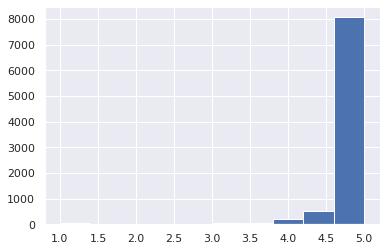

In [248]:
df_feature_subset['review_scores_accuracy'].hist()

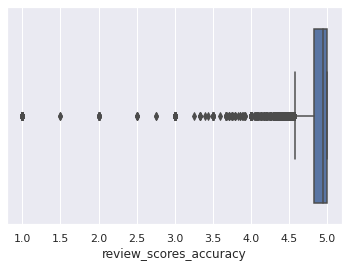

In [249]:
ax = sns.boxplot(x=df_feature_subset['review_scores_accuracy'])

In [250]:
df_feature_subset['review_scores_accuracy'].median()

4.95

With the missing values for the review_scores_accuracy we will fill  that with the median value for this field which is 4.95

In [251]:
df_feature_subset['review_scores_accuracy'] = df_feature_subset['review_scores_accuracy'].fillna(4.95)

/tmp/ipykernel_11060/4079742589.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['review_scores_accuracy'] = df_feature_subset['review_scores_accuracy'].fillna(4.95)


In [252]:
df_feature_subset['last_review'].describe()

count           9026
unique          1273
top       2022-03-06
freq             598
Name: last_review, dtype: object

I think we can drop this column it doesn't pertain information that will be useful for our objective of predicting airbnb_booking rates. Let's also do that for reviews_per_month and host_acceptance_rate

In [253]:
df_feature_subset.drop(columns=['last_review', 'reviews_per_month', 'host_acceptance_rate'], inplace=True)

/tmp/ipykernel_11060/2532484281.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['last_review', 'reviews_per_month', 'host_acceptance_rate'], inplace=True)


Let's see how the review_scores_rating data is spread out

<AxesSubplot:>

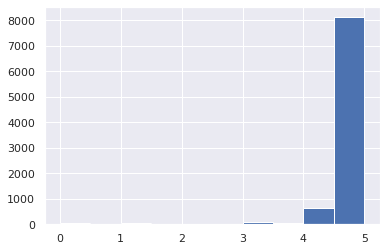

In [254]:
df_feature_subset['review_scores_rating'].hist()

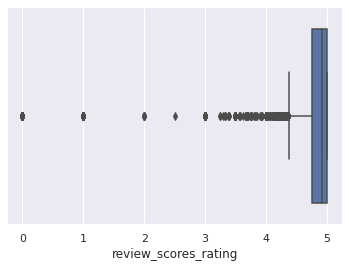

In [255]:
ax = sns.boxplot(x=df_feature_subset['review_scores_rating'])

Seems very similiar to the review_scores accuracy plus let's use the hypothetical of determining a residence's montly booking and its their first time posting. We can't use the review scores rating field because they won't have any reviews but we can use the review scores accuracy as a metric of the host's residence having all that was advertised on their page. In that case perhaps we can do without review_scores_rating so let's go ahead and remove it from our data.

In [256]:
df_feature_subset.drop(columns=['review_scores_rating'], inplace=True)

/tmp/ipykernel_11060/3042065733.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['review_scores_rating'], inplace=True)


Let's view the nan values again for our dataframe to see how we are faring before moving forward

In [257]:
df_feature_subset.isna().sum().sort_values(ascending=False)

bedrooms                                        711
description                                     164
beds                                            150
bathrooms_text                                   16
host_is_superhost                                 3
host_identity_verified                            3
host_has_profile_pic                              3
host_listings_count                               3
host_total_listings_count                         3
host_since                                        3
minimum_minimum_nights                            1
maximum_minimum_nights                            1
minimum_maximum_nights                            1
picture_url                                       1
maximum_nights_avg_ntm                            1
maximum_maximum_nights                            1
minimum_nights_avg_ntm                            1
has_availability                                  0
availability_30                                   0
availability

Let's take one last look at the last significant null value count column which is bedrooms. Based on the spread we can either fill the missing values with a median or get rid of it all together.

In [258]:
df_feature_subset['bedrooms'].dtype

dtype('float64')

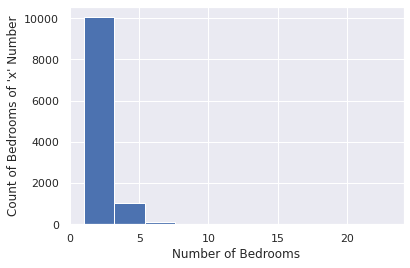

In [259]:
_ = plt.hist(df_feature_subset['bedrooms'])
_ = plt.xlabel("Number of Bedrooms")
_ = plt.ylabel("Count of Bedrooms of 'x' Number")

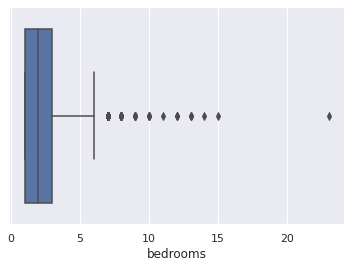

In [260]:
ax = sns.boxplot(x=df_feature_subset['bedrooms'])

Interesting spread of data we I think its safe to say that we can assign the missing data with the median value and test it out.

In [261]:
bedroom_median = df_feature_subset['bedrooms'].median()
df_feature_subset['bedrooms'] = df_feature_subset['bedrooms'].fillna(bedroom_median)

/tmp/ipykernel_11060/926673265.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['bedrooms'] = df_feature_subset['bedrooms'].fillna(bedroom_median)


In [262]:
#Check the null values again
df_feature_subset.isna().sum().sort_values(ascending=False)

description                                     164
beds                                            150
bathrooms_text                                   16
host_total_listings_count                         3
host_has_profile_pic                              3
host_since                                        3
host_identity_verified                            3
host_is_superhost                                 3
host_listings_count                               3
minimum_nights_avg_ntm                            1
maximum_maximum_nights                            1
maximum_nights_avg_ntm                            1
minimum_minimum_nights                            1
maximum_minimum_nights                            1
picture_url                                       1
minimum_maximum_nights                            1
availability_90                                   0
has_availability                                  0
availability_30                                   0
availability

Let's go ahead and drop the other data that is missing from our data frame

In [263]:
df_feature_subset.dropna(inplace=True)

/tmp/ipykernel_11060/1720193771.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.dropna(inplace=True)


In [264]:
df_feature_subset.isna().sum().sort_values(ascending=False)

name                                            0
description                                     0
maximum_nights                                  0
minimum_minimum_nights                          0
maximum_minimum_nights                          0
minimum_maximum_nights                          0
maximum_maximum_nights                          0
minimum_nights_avg_ntm                          0
maximum_nights_avg_ntm                          0
has_availability                                0
availability_30                                 0
availability_60                                 0
availability_90                                 0
availability_365                                0
number_of_reviews                               0
number_of_reviews_ltm                           0
number_of_reviews_l30d                          0
review_scores_accuracy                          0
instant_bookable                                0
calculated_host_listings_count                  0


In [265]:
df_feature_subset.shape

(11652, 48)

<AxesSubplot:>

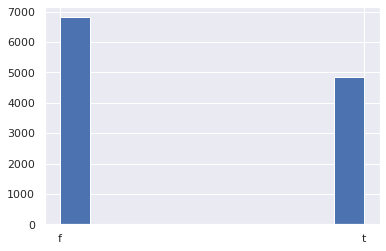

In [266]:
df_feature_subset['instant_bookable'].hist()

Let's conver the boolean string in our data into binary values of 0/1

In [267]:
def convert_to_binary_value(attr):
    return 1 if attr.lower() == 't' else 0

binary_features = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'has_availability', 'instant_bookable']
for feature in binary_features:
    df_feature_subset[feature] = df_feature_subset[feature].apply(convert_to_binary_value)

/tmp/ipykernel_11060/1433683019.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset[feature] = df_feature_subset[feature].apply(convert_to_binary_value)


Fantastic! We were able to do a preliminary cleaning of the data and lost only a few records in the process next we are going to do some further data cleaning and wrangling to see how we can better refine it.

Next we'll go ahead and update the host_since to be a epoch timestamp and create a new column called 'host_since_epoch'

In [268]:
def convert_date_to_timestamp(date_str):
    timestamp = time.mktime(datetime.datetime.strptime(date_str,
                                             "%Y-%m-%d").timetuple())
    return timestamp

df_feature_subset['host_since_timestamp'] = df_feature_subset['host_since'].apply(convert_date_to_timestamp)

/tmp/ipykernel_11060/3308857424.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['host_since_timestamp'] = df_feature_subset['host_since'].apply(convert_date_to_timestamp)


In [269]:
df_feature_subset.drop(columns=['host_since'], inplace=True)

/tmp/ipykernel_11060/4276701940.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['host_since'], inplace=True)


Let's drop the host response time I think that this data is well represented in the host_response_rate percentage.

In [270]:
df_feature_subset.drop(columns=['host_response_time'], inplace=True)

/tmp/ipykernel_11060/1585843487.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['host_response_time'], inplace=True)


## EDA

In this section we are going to combine a little of EDA into our data wrangling and look into ways of how we can transform the values into numeric values that can be interepreted by the neural network

In [273]:
df_feature_subset.dtypes

name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_about                                       object
host_response_rate                               object
host_is_superhost                                 int64
host_listings_count                             float64
host_total_listings_count                       float64
host_has_profile_pic                              int64
host_identity_verified                            int64
neighbourhood                                    object
neighbourhood_cleansed                            int64
property_type                                    object
room_type                                        object
accommodates                                      int64
bathrooms_text                                   object
latitude                                        

I think for the majority of our object data types for this dataframe we can further transform into meaningful representations such as the following:

**Drop neighbourhood_cleansed

-name,description, neighbourhood_overview, host_about -> extract text find patterns of reoccuring words that are associated with our desired target (>= 50% airbnb occupancy) and then create a one hot encoding of these words as additional features

-picture_url -> run this through a CNN for object detection and extract the relevant objects detected in the picture and similiar to the text features above find correlating pattern of objects associated with our desired target and create one hot encoded variables for this data as well.

-host_response_time -> its usually wihtin a days time so let's convert it to hours (1 - 24 hours)

-host_response_rate -> convert to a percentage (acutally there is a column created host_response_rate_percent; so we can drop this column)

-host_since -> Convert to epoch timestamp

-host_listing_count -> convert to numeric value (integer)

-host_is_superhost, host_has_profile_pic, host_identify_verified, instant_bookable, has_availability -> convert to boolean flags

-property_type, room_type, amenities - look for common patterns associated with desired target variable and one_hot encode those patterns from these features

In [274]:
df_feature_subset.drop(columns=['neighbourhood_cleansed'], inplace=True)

/tmp/ipykernel_11060/2829250649.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['neighbourhood_cleansed'], inplace=True)


In [275]:
df_feature_subset.columns

Index(['name', 'description', 'neighborhood_overview', 'picture_url',
       'host_about', 'host_response_rate', 'host_is_superhost',
       'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'latitude', 'longitude', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_accuracy', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_coun

Remember our objective was to be able to predict if our airbnb will have 50% booking or not, let's create our target variable to be able to do this.

In [276]:
def is_optimally_booked(attribute):
    booking_availability_percentage = attribute / 30
    return 0 if booking_availability_percentage < .5 else 1
#Let create our target variable in the dataframe
df_feature_subset['50_percent_or_more_booking'] = df_feature_subset['availability_30'].apply(is_optimally_booked)

/tmp/ipykernel_11060/536319641.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['50_percent_or_more_booking'] = df_feature_subset['availability_30'].apply(is_optimally_booked)


In [277]:
df_feature_subset['50_percent_or_more_booking']

0        0
1        0
2        0
3        0
4        0
        ..
11967    1
11968    1
11969    1
11970    1
11971    1
Name: 50_percent_or_more_booking, Length: 11652, dtype: int64

Next we are going to split the data into two dataframes one with our optimal goal and the other not optimal. Afterwards we are going to do a visualization of the data using word clouds to see what are the frequent words that appear for each of these descriptive fields.

In [278]:
df_is_optimal_booking = df_feature_subset.loc[df_feature_subset['50_percent_or_more_booking'] == 1]
df_non_optimal_booking = df_feature_subset.loc[df_feature_subset['50_percent_or_more_booking'] == 0]

In [279]:
def create_word_cloud(df, attr, collac=False):
    #Let's look at a word cloud for the description see what words are occurring the most
    exclude_list = ['<b>', '</b>', '<br />']#exclude special characters
    text = " ".join(word for word in df[attr] if not pd.isna(word))
    for exclude_char in exclude_list:
        text = text.replace(exclude_char, '')
    stopwords = set(STOPWORDS)
    wordcloud = WordCloud(stopwords=stopwords, background_color="white", collocations=collac, collocation_threshold=3).generate(text)
    plt.figure( figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

Wordcloud for Name

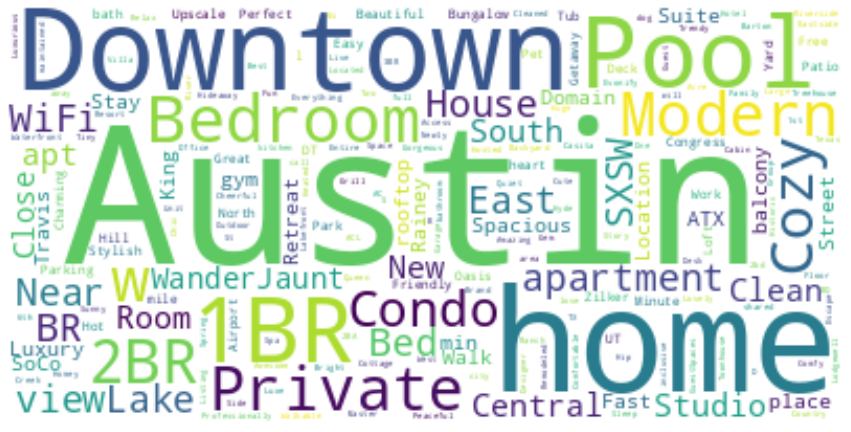

In [280]:
create_word_cloud(df_is_optimal_booking, 'name')

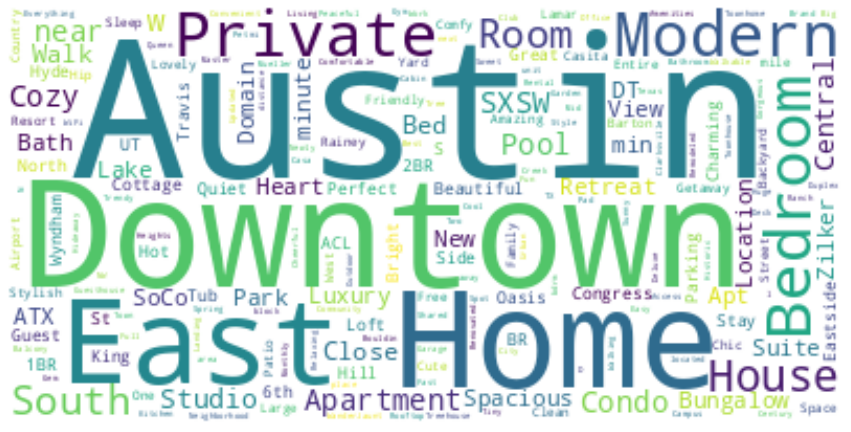

In [281]:
create_word_cloud(df_non_optimal_booking, 'name')

Wordcloud for Description

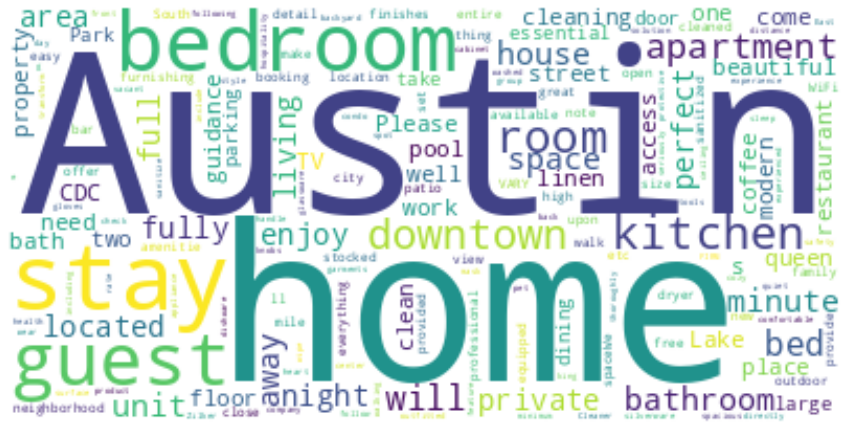

In [282]:
create_word_cloud(df_is_optimal_booking, 'description')

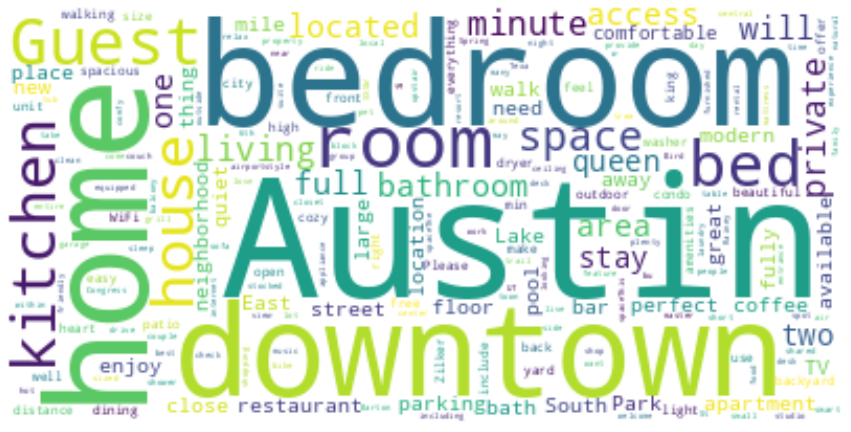

In [283]:
create_word_cloud(df_non_optimal_booking, 'description')

Wordcloud for Neighbourhood_overview

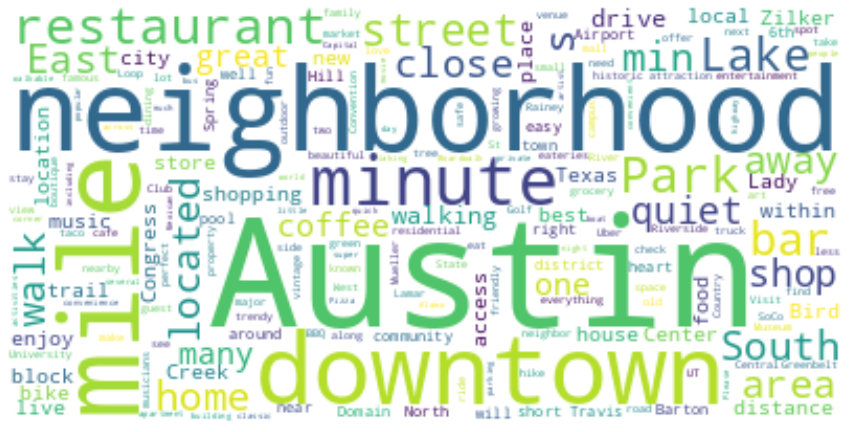

In [284]:
create_word_cloud(df_is_optimal_booking, 'neighborhood_overview')

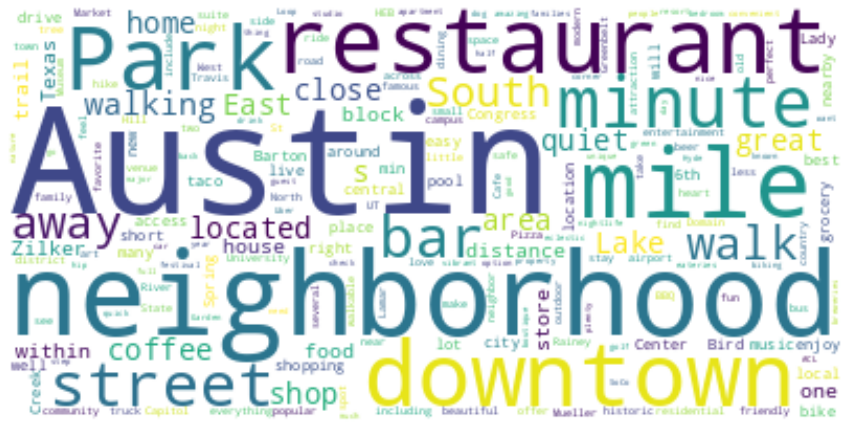

In [285]:
create_word_cloud(df_non_optimal_booking, 'neighborhood_overview')

Wordcloud for host about

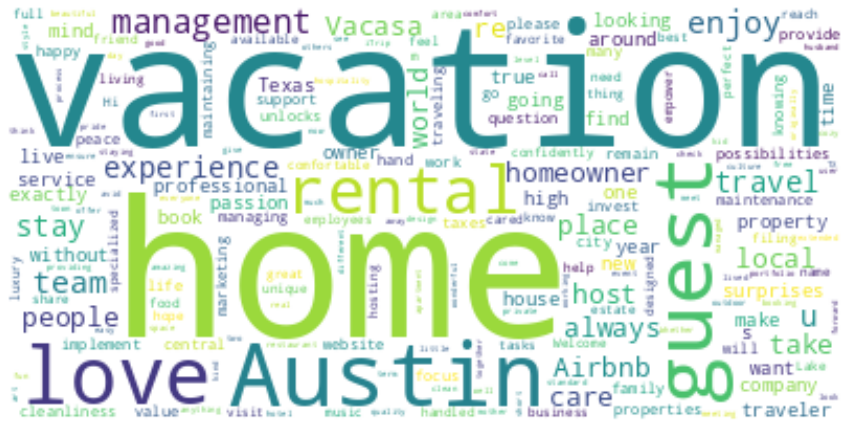

In [286]:
create_word_cloud(df_is_optimal_booking, 'host_about')

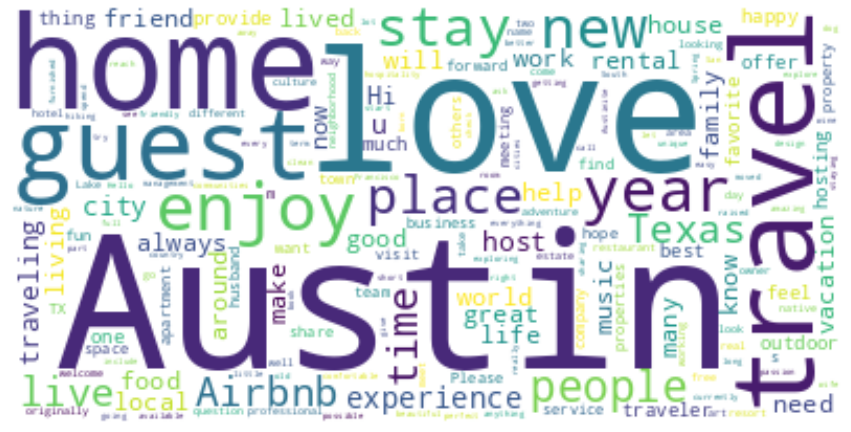

In [287]:
create_word_cloud(df_non_optimal_booking, 'host_about')

I think we found some interesting words that surfaced at the top regarding frequency but I think perhaps we can get some more insight if we incrawse our ngram count from one word to two words.

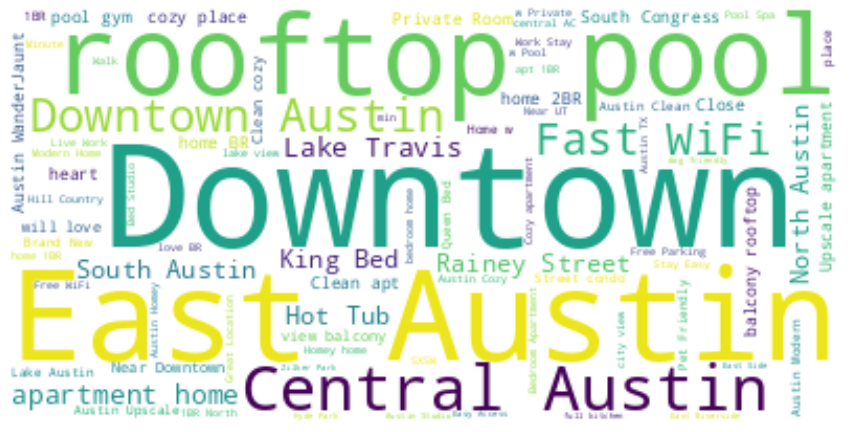

In [288]:
create_word_cloud(df_is_optimal_booking, 'name', collac=True)

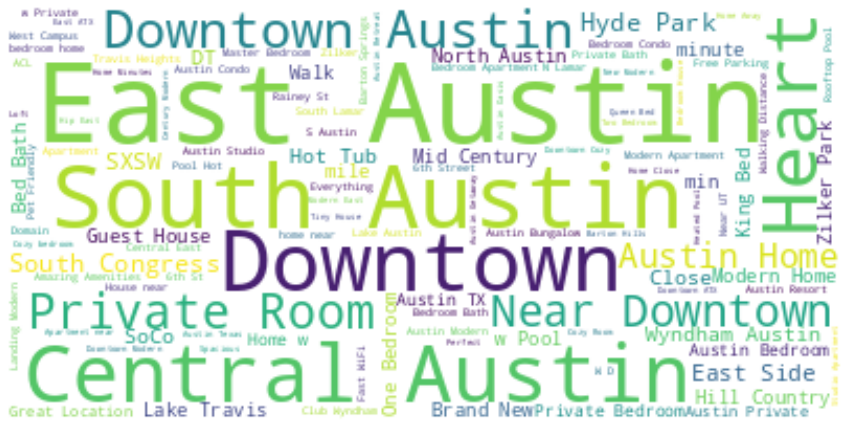

In [289]:
create_word_cloud(df_non_optimal_booking, 'name', collac=True)

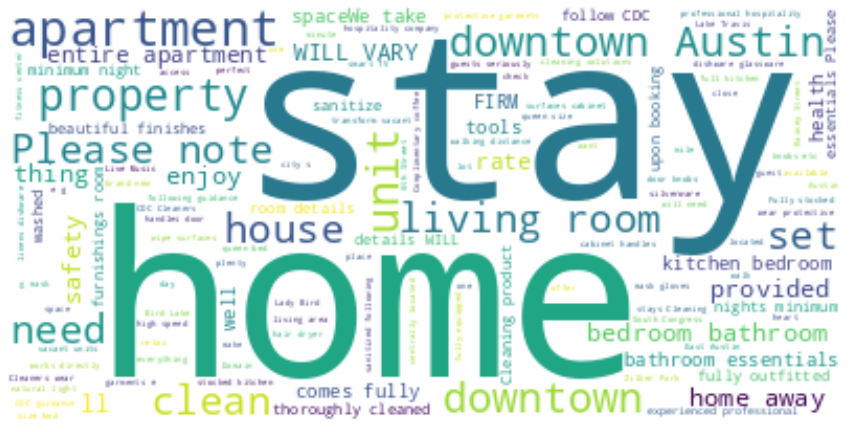

In [290]:
create_word_cloud(df_is_optimal_booking, 'description', collac=True)

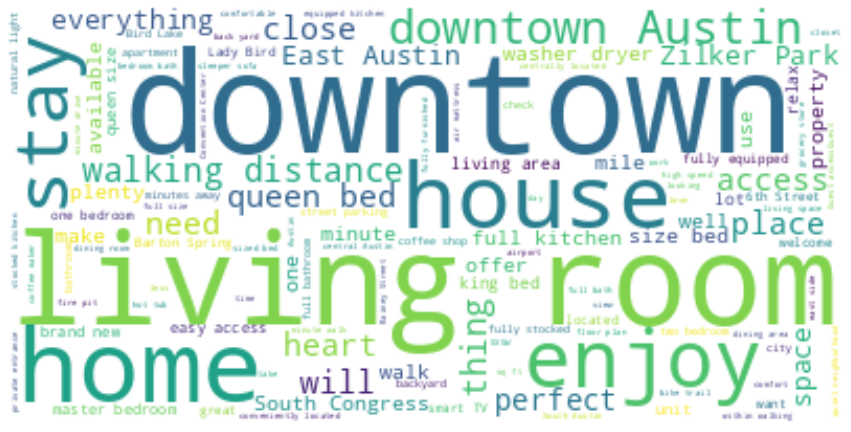

In [291]:
create_word_cloud(df_non_optimal_booking, 'description', collac=True)

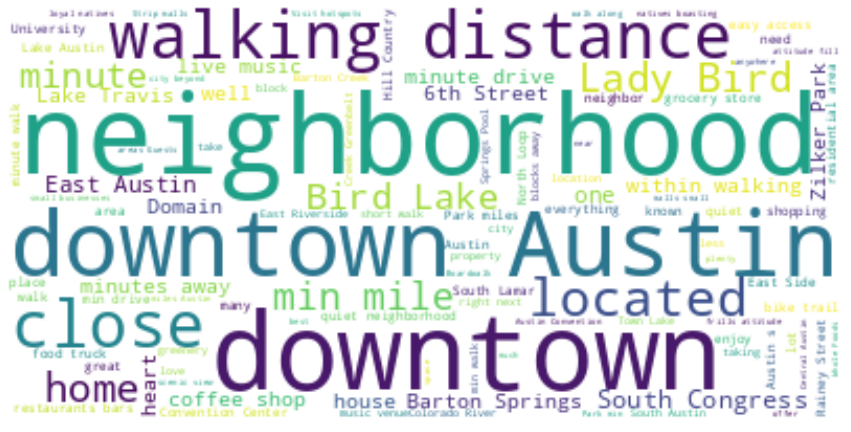

In [292]:
create_word_cloud(df_is_optimal_booking, 'neighborhood_overview', collac=True)

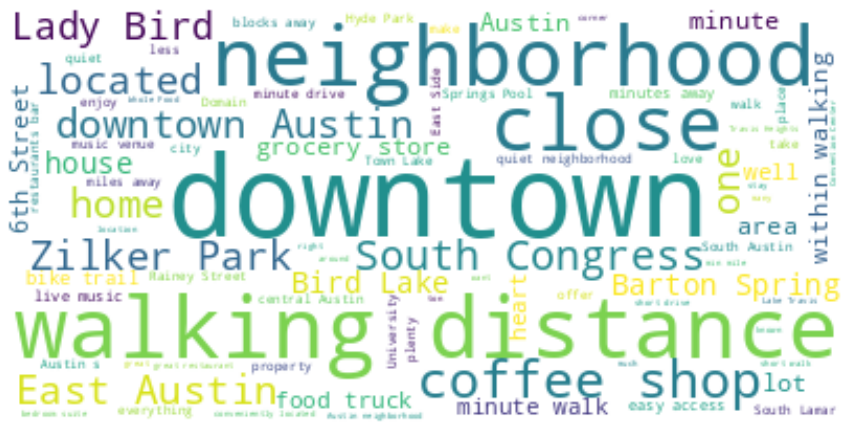

In [293]:
create_word_cloud(df_non_optimal_booking, 'neighborhood_overview', collac=True)

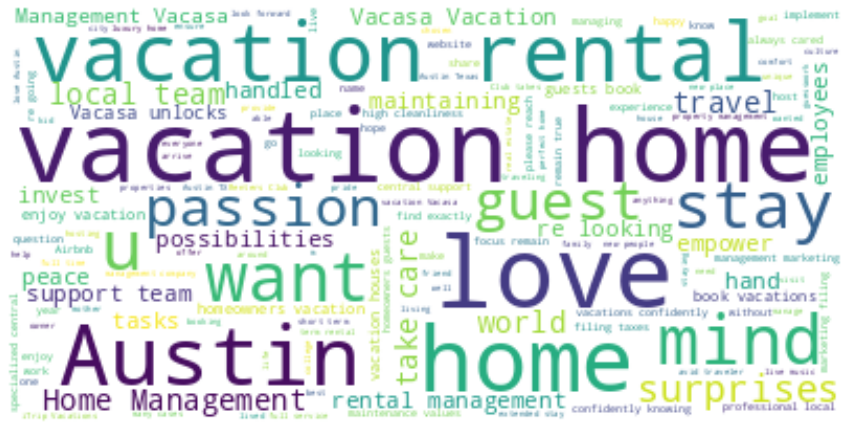

In [294]:
create_word_cloud(df_is_optimal_booking, 'host_about', collac=True)

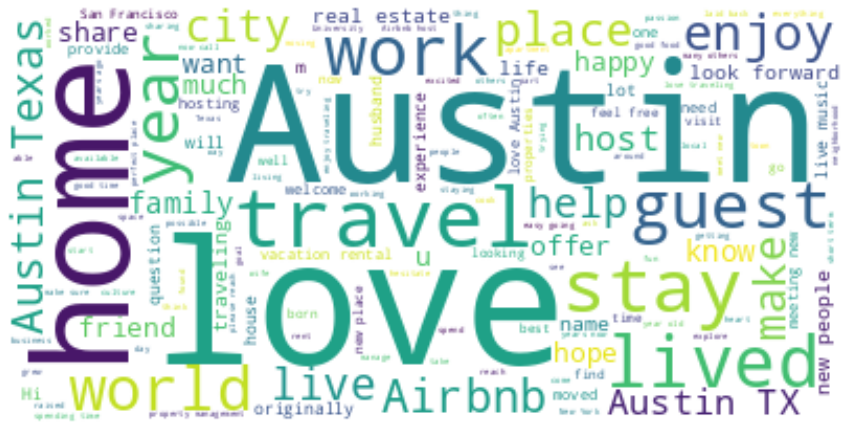

In [295]:
create_word_cloud(df_non_optimal_booking, 'host_about', collac=True)

That's a little better I think we have phrases that certainly gives us a better picture of how these two dataframes differ. As expected Location is king but there are also some ohter interesting insights that almost slid under the radar as well. Such as the name of the airbnb for the optimally booked airbnb seems to include information that are eye catches such as amenities.

Let's do a comparison of the two datasets by looking at the distribution of our target variable using bee swarm plots to compare the both of them

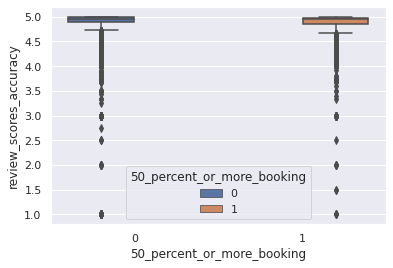

In [296]:
_ = sns.boxplot(x='50_percent_or_more_booking', y='review_scores_accuracy', data=df_feature_subset, hue='50_percent_or_more_booking')
plt.show()

Pretty comparable but it seems that the optimal airbnb residences have a slight edge on accuracy which makes sense usually the residences that embellish naturraly would be booked less than the onese that were true to their advertising. Especially if the advertising was in a positve light about the residence and the surrounding area.

Viewing the distribution of the 30 day booking availabilty for our data based on latitude and longitude and for that we will use a scatterplot

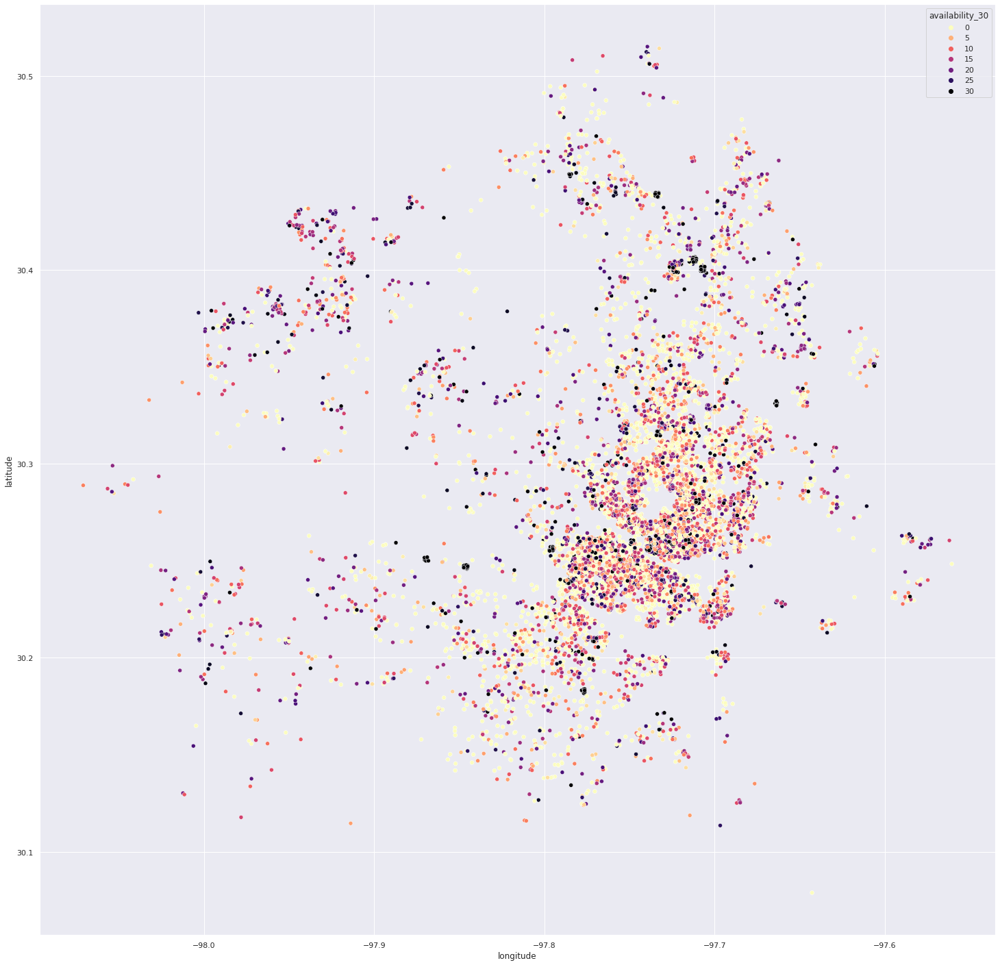

In [297]:
# plotting latitude and longitude as a visual scatter plot to look for location-based outliers

plt.figure(figsize=(25,25))

sns.scatterplot(data=df_feature_subset, x="longitude", y="latitude", hue="availability_30", palette="magma_r");

In [298]:
df_feature_subset['30_day_avail_percentage'] = df['availability_30'] / 30

/tmp/ipykernel_11060/876198860.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['30_day_avail_percentage'] = df['availability_30'] / 30


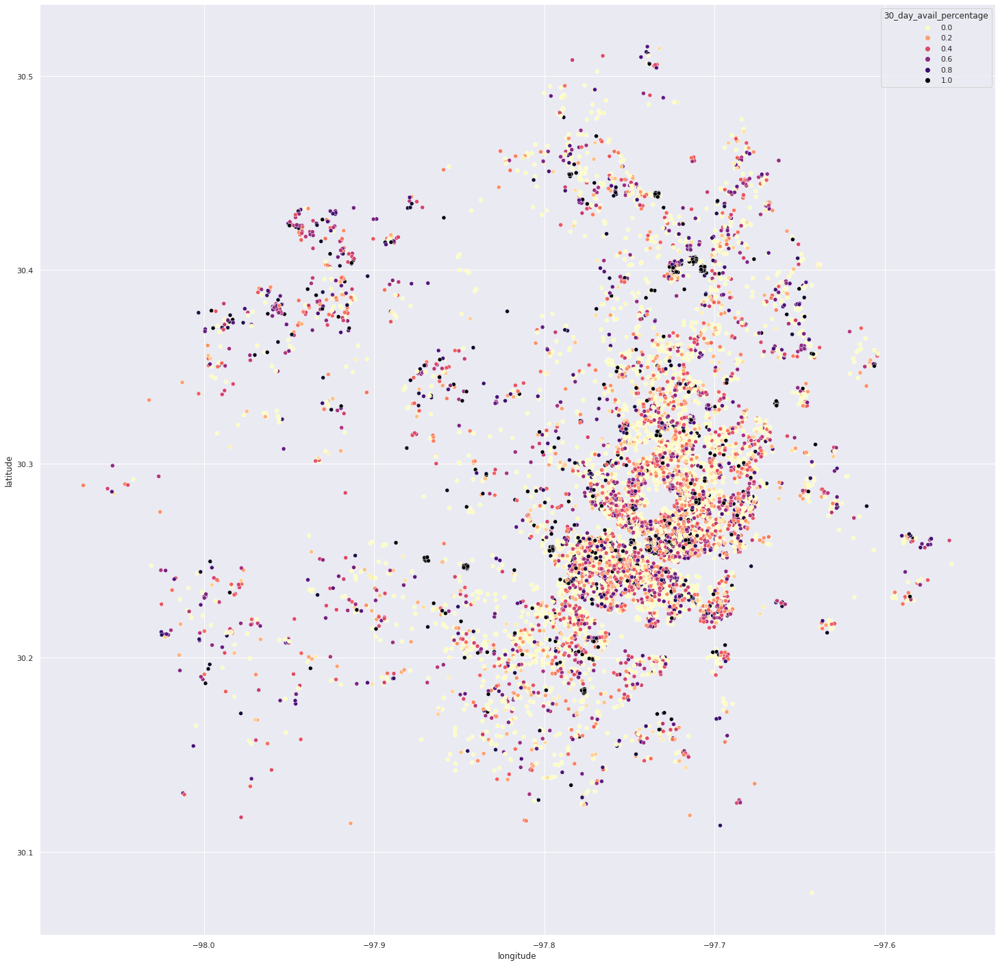

In [299]:
# plotting latitude and longitude as a visual scatter plot to look for location-based outliers

plt.figure(figsize=(25,25))

sns.scatterplot(data=df_feature_subset, x="longitude", y="latitude", hue="30_day_avail_percentage", palette="magma_r");

Interesting it appears that a majority of the airbnb properties are located in south east Austin. But in regards to discernable patterns of where the optimal airbnb 30 day availabilty it also appears that south east Austin has about ~40 availability which is optimal. When we go further North we see that the airbnb's are more sparse but more of the homes have of what we are looking for regarding booking availability for 30 days. However, this distinction does seem somewhat slight. Perhaps there is more to the data than just location that determines a homes availability. To ensure that we are going in the right direction let's do a t-test to determine if there is a significant difference between what we are aiming for what is not our optimal booking.

### Hypothesis Testing (T-Test)

Our null hypothesis for the t-test is that the average 30 day availibility between the optimal and non optimal data sets are the same. If this is the case then we should definitely reconsider our objective for this project.

In [300]:
ttest_ind(df_is_optimal_booking['availability_30'], df_non_optimal_booking['availability_30'])

Ttest_indResult(statistic=190.10271880976074, pvalue=0.0)

Phew! The pvalue returned from this test is reassuring that we are indeed dealing with two distinct datasets and that we should continue going down the path we are. However, we still need to investigate what exactly makes an airbnb residence an optimal booking for a host.

### Identifying Outliers in Data

In this portion we will be taking a look at the data and identifying outlier that may cause confusion for our ml models and we'll look into removing them.

In [301]:
from pandas.api.types import is_numeric_dtype

In [302]:
column_list = list(df_feature_subset.columns)
numeric_columns = []
for column in column_list:
    if is_numeric_dtype(df_feature_subset[column]) and column != 'latitude' and column != 'longitude' :
        numeric_columns.append(column)
numeric_columns

['host_is_superhost',
 'host_listings_count',
 'host_total_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'accommodates',
 'bedrooms',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_accuracy',
 'instant_bookable',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'calculated_host_listings_count_shared_rooms',
 'host_response_rate_percent',
 'host_since_timestamp',
 '50_percent_or_more_booking',
 '30_day_avail_percentage']

array([[<AxesSubplot:title={'center':'host_is_superhost'}>,
        <AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'host_has_profile_pic'}>,
        <AxesSubplot:title={'center':'host_identity_verified'}>,
        <AxesSubplot:title={'center':'accommodates'}>],
       [<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>,
        <AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'minimum_minimum_nights'}>],
       [<AxesSubplot:title={'center':'maximum_minimum_nights'}>,
        <AxesSubplot:title={'center':'minimum_maximum_nights'}>,
        <AxesSubplot:title={'center':'maximum_maximum_nights'}>,
        <AxesSubplot:title={'center':'minimum_nights_avg_ntm'}>,
        <AxesSubplot:title={'center':'ma

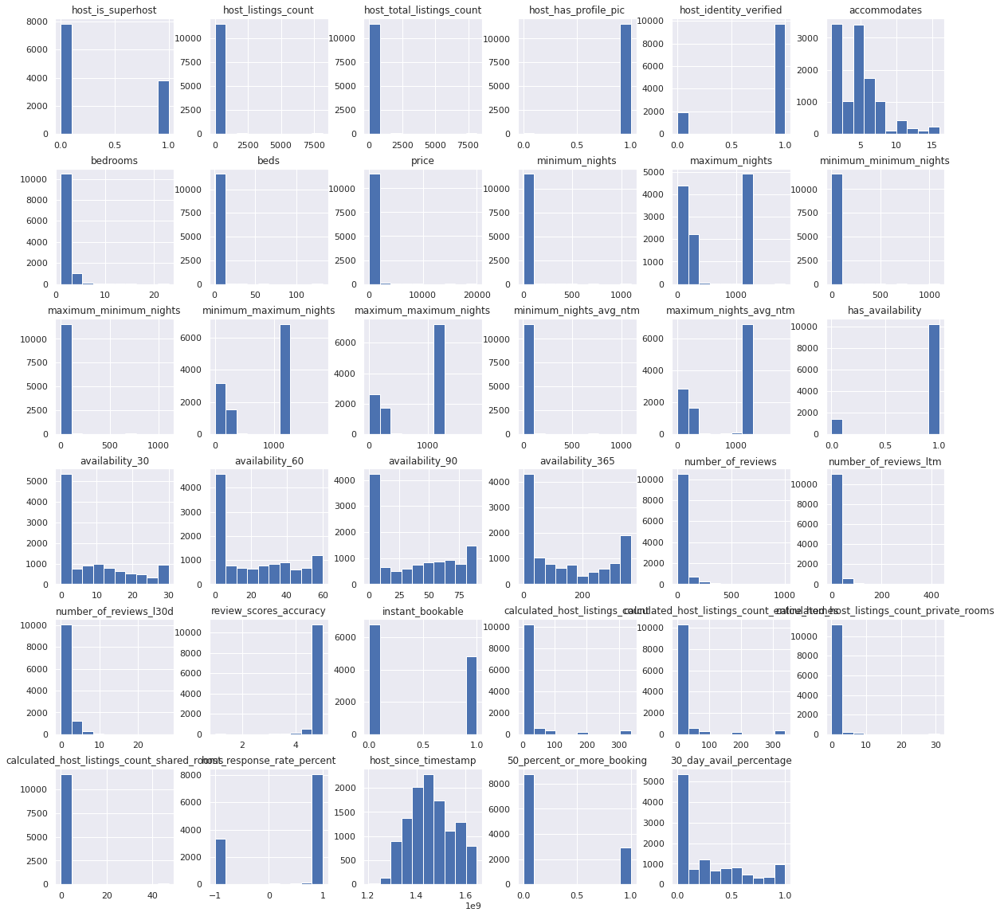

In [303]:
#View histogram of the numeric values
df_feature_subset[numeric_columns].hist(figsize=(20,20))

Very interesting already there are some fields that stand out as having some pretty egregious outliers let's see what we can do to rectify that.

In [304]:
df_feature_subset.sort_values('host_listings_count', ascending=False).head(10)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
6402,"Club Wyndham Austin, 2 Bedroom Presidential Suite","Club Wyndham Austin, 2 Bedroom Presidential Su...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,6,2 baths,30.27061,-97.74777,2.0,3.0,"[""Bathtub"", ""Pool"", ""Crib"", ""Outlet covers"", ""...",623.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,0,0,0,0,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.000000
6084,"Club Wyndham Austin, Texas, Studio","Club Wyndham Austin, Texas, Studio<br /><br />...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire residential home,Entire home/apt,4,1 bath,30.27267,-97.74700,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6059,"Club Wyndham Austin, Texas, 1 Bedroom Deluxe Suit","Club Wyndham Austin, Texas, 1 Bedroom Deluxe S...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.27269,-97.74734,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6060,"Comfortable Club Wyndham Austin, 1 Bedroom Deluxe","Comfortable Club Wyndham Austin, 1 Bedroom Del...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.27221,-97.74651,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6061,"Comfortable Club Wyndham Austin, 1 Bedroom Deluxe","Comfortable Club Wyndham Austin, 1 Bedroom Del...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.27059,-97.74850,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6075,"Comfortable Club Wyndham Austin, Studio","Comfortable Club Wyndham Austin, Studio, Disco...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, 

In [305]:
df_feature_subset.sort_values('host_total_listings_count', ascending=False).head(200)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
6402,"Club Wyndham Austin, 2 Bedroom Presidential Suite","Club Wyndham Austin, 2 Bedroom Presidential Su...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,6,2 baths,30.270610,-97.747770,2.0,3.0,"[""Bathtub"", ""Pool"", ""Crib"", ""Outlet covers"", ""...",623.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,0,0,0,0,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.000000
6084,"Club Wyndham Austin, Texas, Studio","Club Wyndham Austin, Texas, Studio<br /><br />...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire residential home,Entire home/apt,4,1 bath,30.272670,-97.747000,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6059,"Club Wyndham Austin, Texas, 1 Bedroom Deluxe Suit","Club Wyndham Austin, Texas, 1 Bedroom Deluxe S...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.272690,-97.747340,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6060,"Comfortable Club Wyndham Austin, 1 Bedroom Deluxe","Comfortable Club Wyndham Austin, 1 Bedroom Del...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.272210,-97.746510,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6061,"Comfortable Club Wyndham Austin, 1 Bedroom Deluxe","Comfortable Club Wyndham Austin, 1 Bedroom Del...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.270590,-97.748500,1.0,2.0,"[""Bathtub"", ""Pool"", ""Elevator"", ""Crib"", ""Outle...",499.0,2,182,2.0,2.0,182.0,182.0,2.0,182.0,1,1,31,61,265,0,0,0,4.95,1,48,48,0,0,1.0,1.528693e+09,0,0.033333
6075,"Comfortable Club Wyndham Austin, Studio","Comfortable Club Wyndham Austin, Studio, Disco...",Resort Description:<br /><br />Discover the st...,https://a0.muscache.com/pictures/prohost-api/H...,My team and I have access to 917+ resorts thro...,100%,0,8156.0,8156.0,1,1,"Austi

In [306]:
df_feature_subset['host_total_listings_count'].describe()

count    11652.000000
mean        95.811191
std        572.698267
min          0.000000
25%          1.000000
50%          1.000000
75%          7.000000
max       8156.000000
Name: host_total_listings_count, dtype: float64

Interesting so it looks like someone who owns a resort is posting availability in the airbnb site. However, I believe this will really skew our data and we are targeting those who are average at best regarding their listings and we should target those more than our 75% percentile which in this case is 7.

In [307]:
df_feature_subset.shape[0]

11652

In [308]:
df_feature_subset.loc[df_feature_subset['host_total_listings_count'] <= 7].shape[0]

8816

With this change we lost roughly ~4K records but looking at the data it appears that these outliers are represented by a select few who have resources to buy large amount of real estate and these few do not represent the majority we are trying to encapsulate with our ml models. Perhaps that would be done for another project. Let's go ahead and remove them.

In [338]:
df_non_outlier = df_feature_subset.loc[df_feature_subset['host_total_listings_count'] <= 7]
df_non_outlier.shape

(8816, 48)

I am curious however after removing those outliers for the property count did we inadvertenly also do that for the other outliers let's check again with our histogram.

array([[<AxesSubplot:title={'center':'host_is_superhost'}>,
        <AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'host_has_profile_pic'}>,
        <AxesSubplot:title={'center':'host_identity_verified'}>,
        <AxesSubplot:title={'center':'accommodates'}>],
       [<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>,
        <AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'minimum_minimum_nights'}>],
       [<AxesSubplot:title={'center':'maximum_minimum_nights'}>,
        <AxesSubplot:title={'center':'minimum_maximum_nights'}>,
        <AxesSubplot:title={'center':'maximum_maximum_nights'}>,
        <AxesSubplot:title={'center':'minimum_nights_avg_ntm'}>,
        <AxesSubplot:title={'center':'ma

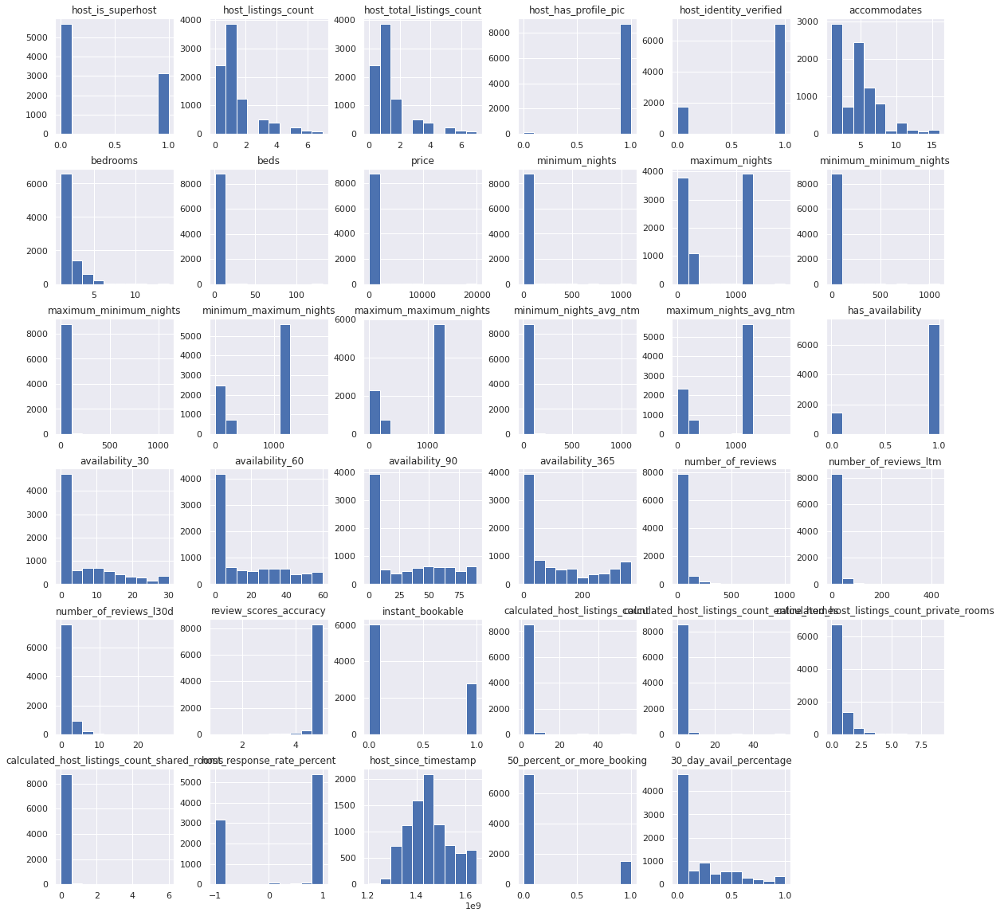

In [339]:
df_non_outlier[numeric_columns].hist(figsize=(20,20))

It did help us a little bit but there are some other fields that clearly have outliers such as min and max stays that also seem skewed perhaps this could be a typo but let's investigate to see why that is the case. First thing let's remove the extraneous columns (the different permutations of min_max, and max_min) I believe the minimum_nights and maximum nights are sufficent enough from our model.

In [340]:
df_non_outlier.drop(columns=['minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm'], inplace=True)

/tmp/ipykernel_11060/474948289.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_non_outlier.drop(columns=['minimum_minimum_nights',


array([[<AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'availability_90'}>],
       [<AxesSubplot:title={'center':'availability_365'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>,
        <AxesSubplot:title={'center':'number_of_reviews_ltm'}>,
        <AxesSubplot:title={'center':'number_of_reviews_l30d'}>,
        <AxesSubplot:title={'center':'review_scores_accuracy'}>],
       [<AxesSubplot:title={'center':'calculated_host_listings_count'}>,
        <AxesSubplot:title={'center':'ca

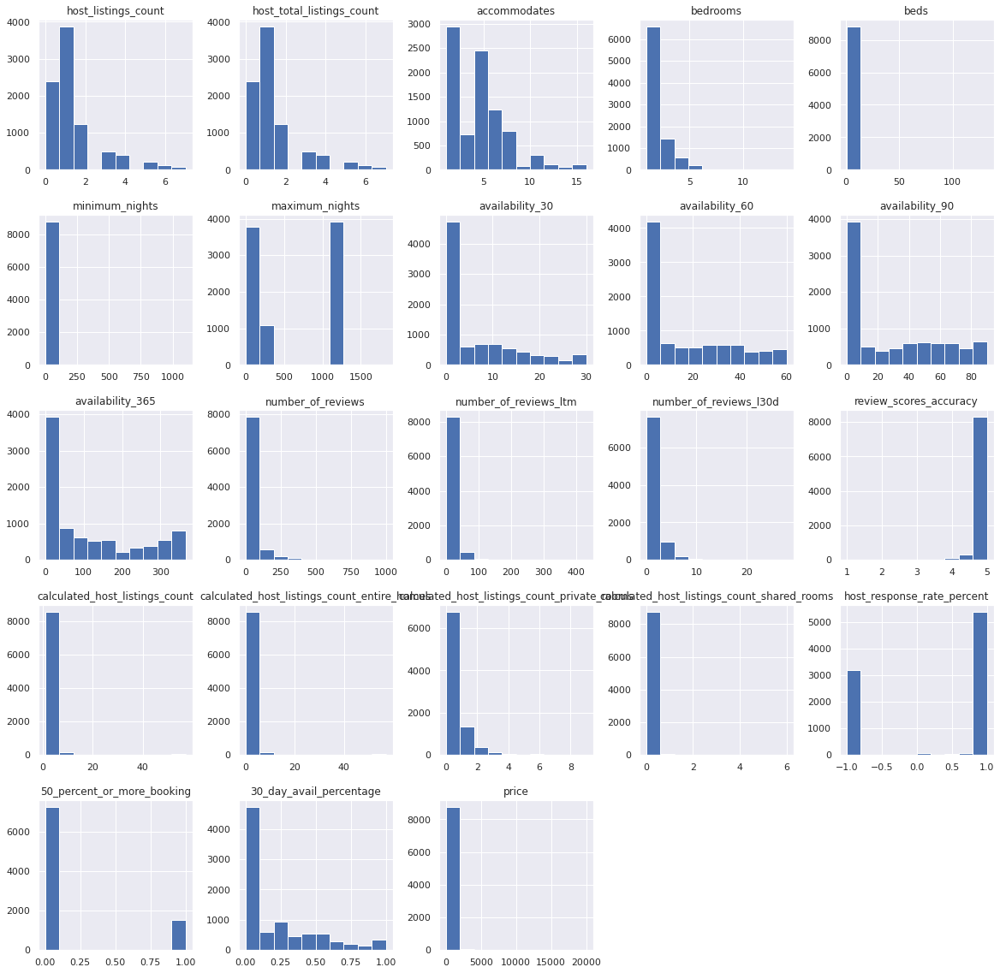

In [316]:
new_numeric_colums = ['host_listings_count',
 'host_total_listings_count',
 'accommodates',
 'bedrooms',
 'beds',
 'minimum_nights',
 'maximum_nights',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_accuracy',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'calculated_host_listings_count_shared_rooms',
 'host_response_rate_percent',
 '50_percent_or_more_booking',
 '30_day_avail_percentage', 'price']
df_non_outlier[new_numeric_colums].hist(figsize=(20,20))

In [317]:
df_non_outlier.sort_values('minimum_nights', ascending=False).head(10)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
3603,Bright and Spacious Home Away From Home,"The Space<br />A quirky, mid-century modern du...","The Neighborhood <br />A diverse, working-clas...",https://a0.muscache.com/pictures/0bd7ba58-d56d...,,N/A,1,1.0,1.0,1,1,"Austin, Texas, United States",Entire home,Entire home/apt,8,1 bath,30.32883,-97.69305,3.0,3.0,"[""Kitchen"", ""Washer"", ""Backyard"", ""Microwave"",...",70.0,1100,1125,1,0,0,0,0,93,0,0,4.91,0,1,1,0,0,-1.0,1.462079e+09,0,0.000000
6730,Clean Chic Condo | Heart of AUS | 6th Street!!,This classy condo is situated in a sublime par...,It is 2 mins walking from Whole foods and Star...,https://a0.muscache.com/pictures/45203f8f-1e66...,"“Live life with no excuses, travel with no reg...",100%,0,3.0,3.0,1,1,"Austin, Texas, United States",Entire condominium (condo),Entire home/apt,4,1 bath,30.27152,-97.75403,1.0,2.0,"[""Private patio or balcony"", ""Dryer"", ""Hair dr...",325.0,999,1125,1,4,24,54,329,7,6,0,4.71,1,2,2,0,0,1.0,1.406956e+09,0,0.133333
2942,"Garden View suite in Bouldin,",Converted Garage with ground floor private ent...,"Very quiet, lots of trees, it is a stand alone...",https://a0.muscache.com/pictures/6b17b768-d11b...,I am a computer engineer. I work from home an...,100%,0,5.0,5.0,1,1,"Austin, Texas, United States",Private room in home,Private room,2,1 private bath,30.24992,-97.75681,1.0,1.0,"[""Kitchen"", ""Washer"", ""Backyard"", ""Microwave"",...",70.0,730,731,1,0,29,59,149,18,0,0,5.00,0,5,0,5,0,1.0,1.330063e+09,0,0.000000
2685,Quiet private space walkable to downtown or So...,Ground floor cave - close the blinds for a qui...,Bouldin is an established neighborhood with a ...,https://a0.muscache.com/pictures/09f4d559-de12...,I am a computer engineer. I work from home an...,100%,0,5.0,5.0,1,1,"Austin, Texas, United States",Private room in home,Private room,2,1 private bath,30.25164,-97.75566,1.0,1.0,"[""Kitchen"", ""Washer"", ""Backyard"", ""Microwave"",...",75.0,730,731,1,0,29,59,149,11,0,0,4.82,0,5,0,5,0,1.0,1.330063e+09,0,0.000000
1441,Large private quiet suite -walk downtown or So...,This is your private bedroom apartment within ...,Bouldin is an established neighborhood with a ...,https://a0.muscache.com/pictures/129202bc-483f...,I am a computer engineer. I work from home an...,100%,0,5.0,5.0,1,1,"Austin, Texas, United States",Private room in home,Private room,2,1 private bath,30.24876,-97.75582,1.0,1.0,"[""Washer"", ""Backyard"", ""Microwave"", ""Stove"", ""...",80.0,730,731,1,0,16,31,121,27,0,0,4.81,0,5,0,5,0,1.0,1.330063e+09,0,0.000000
928,"Private Room& bath, easy walk downtown or SoCo...","Your 200 sq ft, quiet, lockable private room, ...",Bouldin is an established neighborhood with a ...,https://a0.muscache.com/pictures/95070162/7b52...,I am a computer engineer. I work from home an...,100%,0,5.0,5.0,1,1,"Austin, Texas, United States",Private room in home,Private room,2,1 private bath,30.24956,-97.75663,1.0,1.0,"[""Kitchen"", ""Washer"", ""Backyard"", ""Microwave"",...",70.0,730,731,1,0,29,59,149,32,0,0,4.94,0,5,0,5,0,1.0,1.330063e+09,0,0.000000
3220,"Bouldin huge private suite and bath, 600 sq ft b",This is your private living room and bedroom a...,Bouldin is an established neighborhood with a ...,https://a0.muscache.com/pictur

In [318]:
df_non_outlier['minimum_nights'].describe()

count    8816.000000
mean        7.630898
std        30.365673
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max      1100.000000
Name: minimum_nights, dtype: float64

In [319]:
df_non_outlier.loc[df_non_outlier['minimum_nights'] > 30].shape[0]

188

For the purpose of this project we are going to eliminate the outliers that require the guest to stay at the minimum of 30 days since anything more than that and our findings would be picking noise of listings that almost signify to the user that the host is looking for more than just a short-term lease.

In [341]:
df_non_outlier = df_non_outlier.loc[df_non_outlier['minimum_nights'] <= 30]

array([[<AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'availability_90'}>],
       [<AxesSubplot:title={'center':'availability_365'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>,
        <AxesSubplot:title={'center':'number_of_reviews_ltm'}>,
        <AxesSubplot:title={'center':'number_of_reviews_l30d'}>,
        <AxesSubplot:title={'center':'review_scores_accuracy'}>],
       [<AxesSubplot:title={'center':'calculated_host_listings_count'}>,
        <AxesSubplot:title={'center':'ca

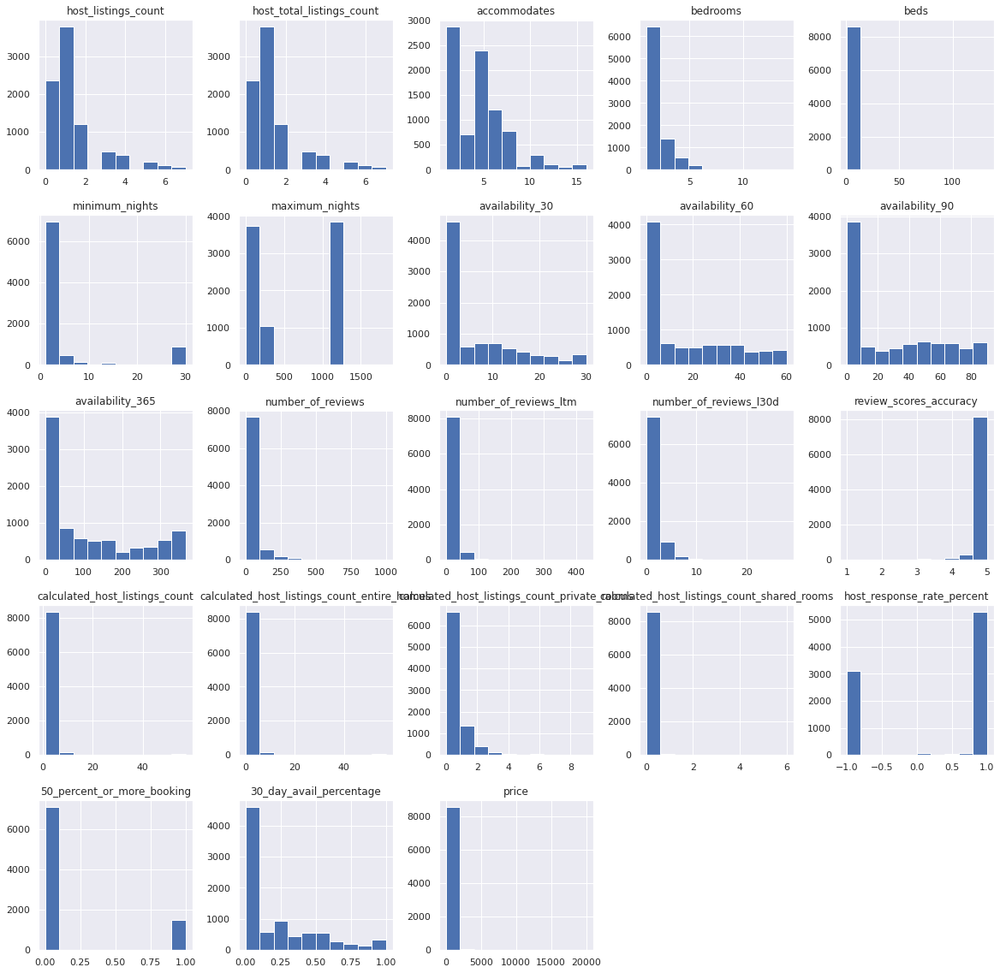

In [321]:
df_non_outlier[new_numeric_colums].hist(figsize=(20,20))

Previously one of the things that we did for missing values regarding host_response_rate_percent was to replace it with -1. Let's take a different approach with this data. Perhaps we can impute these values with the average percentage for host response rate. Let's look at this data.

In [322]:
df_non_outlier.sort_values('host_response_rate_percent').head(10)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
11961,Private Room in a Modern Apartment in North Au...,Beautiful and comfortable master bedroom with ...,,https://a0.muscache.com/pictures/4634dbd8-9a05...,,N/A,0,0.0,0.0,1,1,United States,Private room in casa particular,Private room,2,1 private bath,30.385724,-97.647334,1.0,1.0,"[""Kitchen"", ""Pool"", ""Fire pit"", ""Washer"", ""Lon...",121.0,1,365,1,28,58,88,363,0,0,0,4.95,1,1,0,1,0,-1.0,1.604207e+09,1,0.933333
3538,Contemporary East Austin Smart Home,Spacious three bedroom smart/green home in Eas...,East Austin is a culture packed neighborhood. ...,https://a0.muscache.com/pictures/a976b378-a4cb...,I've lived in Texas for 5 years and have decid...,N/A,1,1.0,1.0,1,1,"Austin, Texas, United States",Entire home,Entire home/apt,6,2.5 baths,30.264500,-97.716920,3.0,3.0,"[""Kitchen"", ""Washer"", ""Backyard"", ""Microwave"",...",290.0,2,31,1,0,0,0,0,67,16,0,5.00,0,1,1,0,0,-1.0,1.488780e+09,0,0.000000
9912,Bright & sleek private bedroom +attached bathr...,Enjoy a stylish experience at this centrally-l...,,https://a0.muscache.com/pictures/c3427334-fd90...,Hello hosts! \n\nA little about myself: I’m a ...,N/A,0,0.0,0.0,1,1,United States,Private room in home,Private room,2,1.5 baths,30.274950,-97.683670,1.0,1.0,"[""Kitchen"", ""Washer"", ""Microwave"", ""Stove"", ""S...",119.0,1,365,0,0,0,0,0,1,1,0,5.00,0,2,1,1,0,-1.0,1.457849e+09,0,0.000000
3541,Great Room for Vanessa,Listing for Vanessa only!,,https://a0.muscache.com/pictures/762cbe83-7e34...,,N/A,0,1.0,1.0,1,0,United States,Private room in home,Private room,2,1 shared bath,30.358680,-97.785360,1.0,1.0,"[""Essentials"", ""TV"", ""Air conditioning"", ""Heat...",10.0,1,1,0,0,0,0,0,0,0,0,4.95,0,1,0,1,0,-1.0,1.511676e+09,0,0.000000
3545,Modern Luxury Apartment in South Lamar,Lamar Union brings a fresh vibe to an iconic s...,,https://a0.muscache.com/pictures/49ab5519-5bd8...,,N/A,0,1.0,1.0,1,1,United States,Entire rental unit,Entire home/apt,2,1 bath,30.256760,-97.762480,1.0,1.0,"[""Kitchen"", ""Washer"", ""Microwave"", ""Stove"", ""S...",125.0,1,1125,0,0,0,0,0,27,0,0,4.96,0,1,1,0,0,-1.0,1.424585e+09,0,0.000000
3547,"Montopolis Backyard Room - Seclusion, Privacy","Separated, quiet room in a back yard in Southe...",,https://a0.muscache.com/pictures/a49bbd9f-c393...,What are 5 things you can’t live without? \nI...,N/A,0,1.0,1.0,1,1,United States,Private room,Private room,2,1.5 shared baths,30.230540,-97.692710,1.0,1.0,"[""Hangers"", ""Essentials"", ""Hair dryer"", ""Kitch...",50.0,1,30,0,0,0,0,0,0,0,0,4.95,0,1,0,1,0,-1.0,1.449986e+09,0,0.000000
3548,PRIVATE RM WITH CELLULAR SHADES FOR RELAXING S...,Quiet house in south Austin right off Slaughte...,,https://a0.muscache.com/pictures/dc8220e5-98df...,31 year old single male. I have a professional...,N/A,0,2.0,2.0,1,0,United States,Private room in home,Private room,2,1 shared bath,30.161880,-97.780200,1.0,1.0,"[""Hangers"", ""Essentials"", ""Smoke alarm"", ""Kitc...",35.0,1,4,0,0,0,0,0,3,0,0,5.00,0,2,0,2,0,-1.0,1.477285e+09,0,0.000000
9902,"Bright, modern 4-bed perfect for families NW H...",Bring the whole family to this one of a kind h...,,https://a0.muscache.com/pictures/miso/Hosting-...,,N/A,0,0.0,0.0,1,1,United States,Entire residential home,Entire home/apt,6,3 baths,30.

In [323]:
df_non_outlier.loc[df_non_outlier['host_response_rate_percent'] == -1].shape[0]

3111

In [342]:
mean_host_response_rate_per = df_non_outlier.loc[df_non_outlier['host_response_rate_percent'] != -1, 'host_response_rate_percent'].mean()
df_non_outlier.loc[df_non_outlier['host_response_rate_percent'] == -1, 'host_response_rate_percent'] = mean_host_response_rate_per

In [325]:
df_non_outlier.shape[0]

8628

Let's look at the bedroom data there seems to be some outliers there as well because they are at such a small amount relative to our overall record total we can probably get rid of this data as well.

In [326]:
df_non_outlier.sort_values('bedrooms', ascending=False).head(10)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
5547,Zilker Lodge,"Tucked away in the heart of Zilker Park, just ...",We are located in the heart of Zilker Park in ...,https://a0.muscache.com/pictures/d740b5c4-ab57...,,80%,0,1.0,1.0,1,0,"Austin, Texas, United States",Entire residential home,Entire home/apt,16,7 baths,30.26433,-97.77482,14.0,132.0,"[""Patio or balcony"", ""Pool"", ""Elevator"", ""Indo...",4500.0,1,1125,1,20,49,50,88,0,0,0,4.95,0,1,1,0,0,0.80,1.561093e+09,1,0.666667
967,Camp Congress Airstream Park and House,Centrally located in Austin's trendiest area -...,Located on S Congress. Tons of local hotspots...,https://a0.muscache.com/pictures/91301350/ec3d...,,100%,0,2.0,2.0,1,1,"Austin, Texas, United States",Entire residential home,Entire home/apt,16,8 baths,30.25569,-97.74675,13.0,22.0,"[""Dryer"", ""Hair dryer"", ""Washer"", ""Dishes and ...",1704.0,2,30,1,16,31,48,267,127,15,2,4.95,0,8,8,0,0,1.00,1.413954e+09,1,0.533333
10559,Large Compound in East Austin (SXSW Special!!),Rare compound in East Austin. This listing inc...,,https://a0.muscache.com/pictures/86d7d446-5c05...,,91%,1,0.0,0.0,1,1,United States,Entire residential home,Entire home/apt,16,7.5 baths,30.25627,-97.73541,13.0,23.0,"[""Pool"", ""Indoor fireplace"", ""Dryer"", ""Hair dr...",20000.0,3,7,1,7,7,7,260,0,0,0,4.95,0,8,3,5,0,0.91,1.585112e+09,0,0.233333
8263,The Retreat at Crystal Creek,The Retreat at Crystal Creek is a unique and i...,,https://a0.muscache.com/pictures/11d33505-85b2...,,100%,1,1.0,1.0,1,1,United States,Entire residential home,Entire home/apt,16,8.5 baths,30.31377,-97.86513,11.0,12.0,"[""Patio or balcony"", ""Toaster"", ""Bathtub"", ""Ce...",3999.0,2,10,1,7,21,29,156,4,4,1,5.00,0,4,4,0,0,1.00,1.501996e+09,0,0.233333
10415,"SoCo Ranch - Central w/Pool, Airstream & Court...","Two homes, airstream and shared courtyard to h...",,https://a0.muscache.com/pictures/miso/Hosting-...,,100%,1,0.0,0.0,1,1,United States,Entire residential home,Entire home/apt,16,5 baths,30.24744,-97.75082,9.0,15.0,"[""Toaster"", ""Bathtub"", ""Ceiling fan"", ""Dryer"",...",2369.0,2,365,1,12,30,44,126,0,0,0,4.95,0,3,3,0,0,1.00,1.629090e+09,0,0.400000
7987,"Jaw-Dropping Luxury Estate | Hot Tub, Sleeps 33",We offer a collection of handcrafted homes des...,Located just southeast of downtown Austin acro...,https://a0.muscache.com/pictures/prohost-api/H...,"Hi! I hope to be an Airbnb host soon, but in t...",100%,0,2.0,2.0,1,1,"Austin, Texas, United States",Entire residential home,Entire home/apt,16,5.5 baths,30.23077,-97.69821,9.0,20.0,"[""Patio or balcony"", ""Bathtub"", ""Dryer"", ""Hair...",1800.0,1,1125,1,9,19,38,276,18,18,0,4.78,1,2,2,0,0,1.00,1.576735e+09,0,0.300000
7599,Huge Group Compound | Heart of ATX | Sleeps 41,Complex of two houses right next to downtown p...,,https://a0.muscache.com/pictures/miso/Hosting-...,Hi! I'm Preston and I've been hosting in Austi...,100%,1,1.0,1.0,1,1,United States,Entire residential home,Entire home/apt,16,6 baths,30.24432,-97.73032,9.0,24.0,"[""Dryer"", ""Hair dryer"", ""Washer"", ""Security ca...",1963.0,3,1125,1,6,15,23,223,0,0,0,4.95,0,5,5,0,0,1.00,1.383455e+09,0,0.200000
5834,Stunning Estate | Private Heated Pool,We offer a collection of handcrafted homes des...,"Located close to downtown Austin, but in a q

In [327]:
df_non_outlier['bedrooms'].describe()

count    8628.000000
mean        1.938340
std         1.145657
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        14.000000
Name: bedrooms, dtype: float64

In [328]:
df_non_outlier.loc[df_non_outlier['bedrooms'] > 4].shape[0]

248

In [343]:
df_non_outlier = df_non_outlier.loc[df_non_outlier['bedrooms'] <= 4]

array([[<AxesSubplot:title={'center':'host_listings_count'}>,
        <AxesSubplot:title={'center':'host_total_listings_count'}>,
        <AxesSubplot:title={'center':'accommodates'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'beds'}>],
       [<AxesSubplot:title={'center':'minimum_nights'}>,
        <AxesSubplot:title={'center':'maximum_nights'}>,
        <AxesSubplot:title={'center':'availability_30'}>,
        <AxesSubplot:title={'center':'availability_60'}>,
        <AxesSubplot:title={'center':'availability_90'}>],
       [<AxesSubplot:title={'center':'availability_365'}>,
        <AxesSubplot:title={'center':'number_of_reviews'}>,
        <AxesSubplot:title={'center':'number_of_reviews_ltm'}>,
        <AxesSubplot:title={'center':'number_of_reviews_l30d'}>,
        <AxesSubplot:title={'center':'review_scores_accuracy'}>],
       [<AxesSubplot:title={'center':'calculated_host_listings_count'}>,
        <AxesSubplot:title={'center':'ca

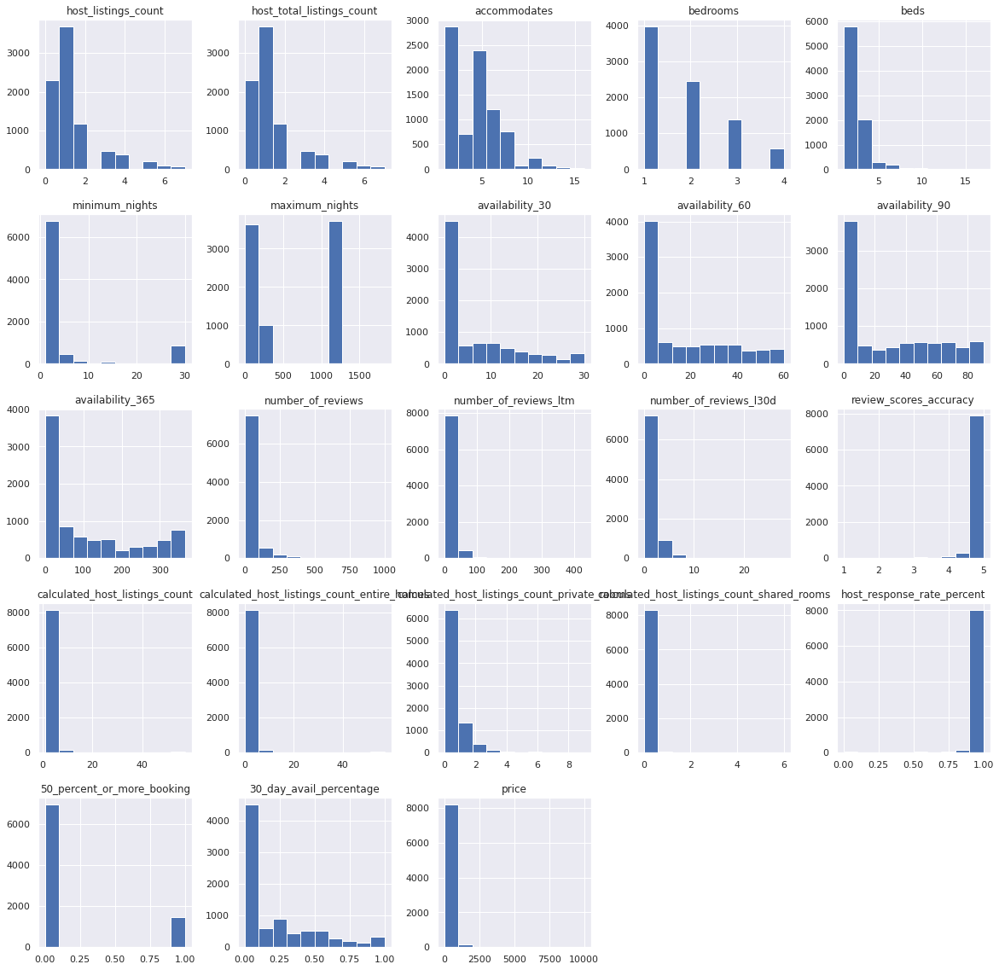

In [330]:
df_non_outlier[new_numeric_colums].hist(figsize=(20,20))

Lastly as our last variable that we are looking into for our EDA will be our price there definitely seems to be a skew. Let's see why that is the case.

In [331]:
df_non_outlier['price'].describe()

count     8380.000000
mean       282.949165
std        392.868394
min          1.000000
25%        102.000000
50%        188.000000
75%        333.000000
max      10000.000000
Name: price, dtype: float64

In [333]:
df_non_outlier.sort_values('price', ascending=False).head(10)

,name,description,neighborhood_overview,picture_url,host_about,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bathrooms_text,latitude,longitude,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_accuracy,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_response_rate_percent,host_since_timestamp,50_percent_or_more_booking,30_day_avail_percentage
6507,"ARRIVE Austin, Studio",Drop your bag and stay a minute.<br /><br />Th...,We love Austin and all the people who call it ...,https://a0.muscache.com/pictures/fef15b89-4859...,,0%,0,0.0,0.0,1,1,"Austin, Texas, United States",Room in boutique hotel,Private room,2,1 private bath,30.26065,-97.72315,2.0,1.0,"[""Essentials"", ""Hangers"", ""First aid kit"", ""Lo...",10000.0,1,1125,1,30,60,90,365,0,0,0,4.95,1,1,0,1,0,0.00000,1.579759e+09,1,1.000000
10663,East Austin Hotel,"This boutique Austin hotel is locally owned, o...",,https://a0.muscache.com/pictures/miso/Hosting-...,,0%,0,0.0,0.0,1,1,United States,Room in hotel,Private room,4,1 private bath,30.26370,-97.73168,1.0,1.0,"[""Pool"", ""Elevator"", ""Private patio or balcony...",10000.0,1,365,1,30,60,90,364,0,0,0,4.95,1,1,0,1,0,0.00000,1.571980e+09,1,1.000000
902,The Cathédrale,"A spacious, fully-furnished, home with Parisia...",,https://a0.muscache.com/pictures/74944003/ad3e...,I am an entrepreneur who thrives on Austin’s c...,N/A,0,1.0,1.0,1,1,United States,Entire home,Entire home/apt,10,3 baths,30.31706,-97.68310,4.0,4.0,"[""Essentials"", ""Heating"", ""Smoke alarm"", ""Kitc...",10000.0,30,900,1,0,0,0,0,3,0,0,5.00,0,1,1,0,0,0.96545,1.413781e+09,0,0.000000
6223,Cozy and warm condo with lots of space and pri...,Hi! We have a cozy and comfortable place speci...,"It is a quiet, beautiful community with lots o...",https://a0.muscache.com/pictures/95ec0acd-5cc5...,,N/A,0,1.0,1.0,1,0,"Austin, Texas, United States",Private room in condominium (condo),Private room,2,1 private bath,30.43630,-97.77760,1.0,1.0,"[""Patio or balcony"", ""Indoor fireplace"", ""Drye...",9998.0,5,20,1,29,59,89,179,3,0,0,5.00,0,1,0,1,0,0.96545,1.464584e+09,1,0.966667
375,The Graeber by Lodgewell>>6th Street + Pool = ...,"If these walls could talk, they couldn’t tell ...","World famous music capital of the world, Austi...",https://a0.muscache.com/pictures/e2cc429c-d90b...,Professionally managed by Chereen Fisher and h...,100%,1,1.0,1.0,1,1,"Austin, Texas, United States",Entire townhouse,Entire home/apt,12,3.5 baths,30.26820,-97.73773,4.0,7.0,"[""Toaster"", ""Bathtub"", ""Clothing storage: clos...",8929.0,1,1125,1,17,36,49,49,72,12,2,4.80,1,1,1,0,0,1.00000,1.364792e+09,1,0.566667
299,Luxury Hill Country Condo Awaits...,Panoramic view of the Texas Hill Country just ...,"You'll be staying in the laid-back, relaxing O...",https://a0.muscache.com/pictures/51697072/833d...,"33 yrs old. Born in Texas, Raised in Florida. ...",N/A,0,1.0,1.0,1,1,"Austin, Texas, United States",Private room in rental unit,Private room,4,1 bath,30.22547,-97.86482,1.0,2.0,"[""Free parking on premises"", ""Essentials"", ""He...",5021.0,3,14,0,0,0,0,0,2,0,0,5.00,0,1,0,1,0,0.96545,1.344229e+09,0,0.000000
840,Entire Apt ON Town Lake 4 ACL,This cozy 1 bedroom 1 bath sleeps 6 and is phy...,,https://a0.muscache.com/pictures/52994573/b6af...,"I love paddleboarding, Amy's ice cream, and he...",N/A,0,2.0,2.0,1,1,United States,Entire rental unit,Entire home/apt,6,1 bath,30.26413,-97.76126,1.0,3.0,"[""Essentials"", ""Kitchen"", ""Pool"", ""Long term s...",5000.0,2,1125,1,30,60,90,365,7,0,0,4.67,0,2,2,0,0,0.96545,1.411880e+09,1,1.000000
668,3 Story House Over Lake Austin,"Fabulous Custo

Once again this looks to be a little on the extreme side and we don't want to introduce noise into our model so we will eliminate any data that is above the $2500 a night of data for airbnb pricing.

In [344]:
df_non_outlier = df_non_outlier.loc[df_non_outlier['price'] <= 2500]

Ok That is it for our Preprocessing and EDA. In our next step we will be taking a look at feature engineering and modeling for our data and test the results. As mentioned earlier we will be implementing DNN libraries such as YOLO for object detection and tensorflow classifier to predict our booking availability for 30 days. Excited to try this out.

### Word Frequency using NLTK and Fuzzy Matching

There are several techniques to viewing word frequence and for our amenties, property type and room types to see what are the words that stand out the most, and we will do fuzzy matching to ensure that we can create additional fields using one hot encoding for the top (10) amenities.

In [92]:
df_is_optimal_booking.shape

(2917, 48)

In [93]:
df_non_optimal_booking.shape

(8735, 48)

In [94]:
#aggregate the amenities for the two dataframes into their respective paragraphs
amenities_optimal_booking_list = list(df_is_optimal_booking['amenities'])
amenities_optimal_booking_list = list(map(lambda x: json.loads(x), amenities_optimal_booking_list))
amenities_optimal_booking_text = " ".join([". ".join(amenities_str) for amenities_str in amenities_optimal_booking_list])

In [95]:
amenities_nonoptimal_booking_list = list(df_non_optimal_booking['amenities'])
amenities_nonoptimal_booking_list = list(map(lambda x: json.loads(x), amenities_nonoptimal_booking_list))
amenities_nonoptimal_booking_text = " ".join([". ".join(amenities_str) for amenities_str in amenities_nonoptimal_booking_list])

In [96]:
#Download text sentence tokenizer and stopwords from nltk library
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mgfos207/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/mgfos207/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [97]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
stop_words = set(stopwords.words('english'))

In [98]:
tokenized_sent = nltk.sent_tokenize(amenities_optimal_booking_text)
optimal_filtered_sentence = [sent.replace(".", "") for sent in tokenized_sent]

In [100]:
tokenized_sent = nltk.sent_tokenize(amenities_nonoptimal_booking_text)
nonoptimal_filtered_sentence = [sent.replace(".", "") for sent in tokenized_sent]

In [101]:
optimal_amenities_counter = Counter(optimal_filtered_sentence)
nonoptimal_amenities_counter = Counter(nonoptimal_filtered_sentence)

In [104]:
optimal_amenities_counter.most_common(10)

[('Wifi', 2799),
 ('Long term stays allowed', 2581),
 ('Smoke alarm', 2530),
 ('Kitchen', 2438),
 ('Essentials', 2388),
 ('Air conditioning', 2378),
 ('Hair dryer', 2351),
 ('Shampoo', 2288),
 ('Hangers', 2274),
 ('Iron', 2248)]

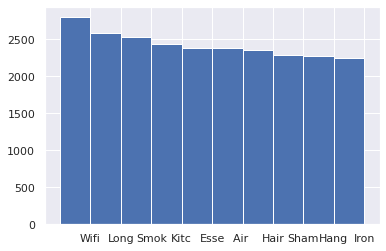

In [107]:
#Create bar graph of the top amenities
labels, values = zip(*optimal_amenities_counter.most_common(10))
labels = list(map(lambda x: x[:4], labels))
indexes = np.arange(len(labels))
width = 1
plt.bar(indexes, values, width)
plt.xticks(indexes + width * 0.5, labels)
plt.show()

In [99]:
nonoptimal_amenities_counter.most_common(10)

[('Wifi', 8299),
 ('Air conditioning', 8060),
 ('Smoke alarm', 7697),
 ('Free parking on premises', 6772),
 ('Long term stays allowed', 6724),
 ('Essentials', 6707),
 ('Heating', 6456),
 ('Washer', 6394),
 ('Shampoo', 6344),
 ('Hair dryer', 6263)]

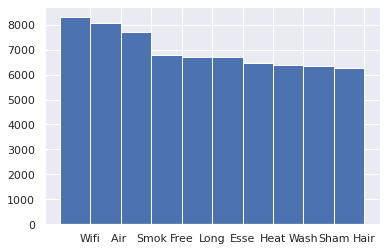

In [108]:
#Create bar graph of the top amenities
labels, values = zip(*nonoptimal_amenities_counter.most_common(10))
labels = list(map(lambda x: x[:4], labels))
indexes = np.arange(len(labels))
width = 1
plt.bar(indexes, values, width)
plt.xticks(indexes + width * 0.5, labels)
plt.show()

There are some similiarities between the two let's merge them together and use that for one hot encoding for the amenities.

In [100]:
top_amenities_set = set()
optimal_amenities_set = set([common_word[0] for common_word in optimal_amenities_counter.most_common(10)])
nonoptimal_amenties_set = set([common_word[0] for common_word in nonoptimal_amenities_counter.most_common(10)])
top_amenities_set = optimal_amenities_set.union(nonoptimal_amenties_set)

top_amenities_set

{'Air conditioning',
 'Essentials',
 'Free parking on premises',
 'Hair dryer',
 'Hangers',
 'Heating',
 'Iron',
 'Kitchen',
 'Long term stays allowed',
 'Shampoo',
 'Smoke alarm',
 'Washer',
 'Wifi'}

In [144]:
#Fuzzy matching
#Iterate over each of the top amenties and create one hot encoded columns
def _find_fuzzy_match(amenities_list, amenity):
    parsed_amenities_list = json.loads(amenities_list)
    for amenity_text in parsed_amenities_list:
        if fuzz.ratio(amenity.lower(), amenity_text.lower()) >= 85:
            return 1
    return 0

for amenity in top_amenities_set:
    df_feature_subset[f'has_{amenity.lower()}'] = df_feature_subset['amenities'].apply(lambda x: _find_fuzzy_match(x, amenity))

/tmp/ipykernel_10322/2827278505.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset[f'has_{amenity.lower()}'] = df_feature_subset['amenities'].apply(lambda x: _find_fuzzy_match(x, amenity))
/tmp/ipykernel_10322/2827278505.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset[f'has_{amenity.lower()}'] = df_feature_subset['amenities'].apply(lambda x: _find_fuzzy_match(x, amenity))
/tmp/ipykernel_10322/2827278505.py:11: SettingWithCopyWarning: 
A value is trying to be set on

In [145]:
df_feature_subset.columns

Index(['name', 'description', 'neighborhood_overview', 'picture_url',
       'host_since', 'host_about', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'latitude', 'longitude', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_accuracy', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
 

In [146]:
#Drop redundant amenities column
df_feature_subset.drop(columns=['amenities'], inplace=True)

/tmp/ipykernel_10322/3151857365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['amenities'], inplace=True)


Picking up from our last time looking at the data we gleaned that most property types that are successful are offering entire space versus a private portion of the residence. Let's apply the same thing here for our data.

In [147]:
import re

In [149]:
def _match_property_type_entire_space(prop_type):
    entire_space = bool(re.search('Entire', prop_type, re.IGNORECASE))
    return 1 if entire_space else 0

In [150]:
df_feature_subset['entire_space'] = df_feature_subset['property_type'].apply(_match_property_type_entire_space)

/tmp/ipykernel_10322/1800255235.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset['entire_space'] = df_feature_subset['property_type'].apply(_match_property_type_entire_space)


In [152]:
df_feature_subset.drop(columns=['property_type'], inplace=True)

/tmp/ipykernel_10322/172344808.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['property_type'], inplace=True)


In [153]:
df_feature_subset.columns

Index(['name', 'description', 'neighborhood_overview', 'picture_url',
       'host_since', 'host_about', 'host_response_time', 'host_response_rate',
       'host_is_superhost', 'host_listings_count', 'host_total_listings_count',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'room_type', 'accommodates', 'bathrooms_text', 'latitude', 'longitude',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_accuracy', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count

After looking at the long text fields such as name, description and neighborhood overview it appears that they mainly highlight location and amenities and room details all of which we can glean from the other fields in the data, so let's drop those columns.

In [154]:
df_feature_subset.drop(columns=['name', 'description', 'neighborhood_overview'], inplace=True)

/tmp/ipykernel_10322/2778044314.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['name', 'description', 'neighborhood_overview'], inplace=True)


In [163]:
df_feature_subset.drop(columns=['host_about'], inplace=True)

/tmp/ipykernel_10322/611662208.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['host_about'], inplace=True)


In [164]:
df_feature_subset.drop(columns=['host_response_rate'], inplace=True)

/tmp/ipykernel_10322/3717777679.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feature_subset.drop(columns=['host_response_rate'], inplace=True)


In [155]:
df_feature_subset.columns

Index(['picture_url', 'host_since', 'host_about', 'host_response_time',
       'host_response_rate', 'host_is_superhost', 'host_listings_count',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood', 'room_type', 'accommodates',
       'bathrooms_text', 'latitude', 'longitude', 'bedrooms', 'beds', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_accuracy', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listing

In [169]:
df_feature_subset['neighbourhood'].value_counts()

Austin, Texas, United States                    6877
United States                                   4662
Lakeway, Texas, United States                     29
West Lake Hills, Texas, United States             14
Dripping Springs, Texas, United States            14
Sunset Valley, Texas, United States                8
Manchaca, Texas, United States                     6
Round Rock, Texas, United States                   5
Leander, Texas, United States                      5
The Hills, Texas, United States                    4
Bee Cave, Texas, United States                     3
Pflugerville, Texas, United States                 3
Lago Vista, Texas, United States                   2
Austin , Texas, United States                      2
Austin, United States                              2
Buda, Texas, United States                         2
Del Valle, Texas, United States                    2
Cedar Park, Texas, United States                   2
Austin, Tx, United States                     

In [170]:
df_is_optimal_booking['neighbourhood'].value_counts()

United States                             1558
Austin, Texas, United States              1325
Dripping Springs, Texas, United States       8
Lakeway, Texas, United States                5
Leander, Texas, United States                5
West Lake Hills, Texas, United States        4
Round Rock, Texas, United States             4
Sunset Valley, Texas, United States          3
Austin , Texas, United States                2
Manchaca, Texas, United States               1
Travis County, Texas, United States          1
Pflugerville, Texas, United States           1
Name: neighbourhood, dtype: int64

In [171]:
df_non_optimal_booking['neighbourhood'].value_counts()

Austin, Texas, United States                    5552
United States                                   3104
Lakeway, Texas, United States                     24
West Lake Hills, Texas, United States             10
Dripping Springs, Texas, United States             6
Manchaca, Texas, United States                     5
Sunset Valley, Texas, United States                5
The Hills, Texas, United States                    4
Bee Cave, Texas, United States                     3
Lago Vista, Texas, United States                   2
Austin, United States                              2
Buda, Texas, United States                         2
Del Valle, Texas, United States                    2
Pflugerville, Texas, United States                 2
Cedar Park, Texas, United States                   2
Bouldin, Austin, Texas, United States              1
Manor, Austin, Texas, United States                1
Rollingwood, Texas, United States                  1
Volente, Texas, United States                 

Let's create a one hot encoding for the neighbourhood

In [172]:
df_dummy = pd.get_dummies(df_feature_subset, columns=['neighbourhood'])
df_dummy.head()

,picture_url,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,latitude,...,"neighbourhood_Pflugerville, Texas, United States","neighbourhood_Rollingwood, Texas, United States","neighbourhood_Round Rock, Texas, United States","neighbourhood_Sunset Valley, Texas, United States","neighbourhood_The Hills, Texas, United States","neighbourhood_Travis County, Texas, United States",neighbourhood_United States,"neighbourhood_Volente, Texas, United States","neighbourhood_West Lake Hills, Texas, United States","neighbourhood_Westlake Hills, Austin, Texas, United States"
0,https://a0.muscache.com/pictures/14084884/b5a3...,1,1.0,1.0,1,1,Entire home/apt,3,1 bath,30.26057,...,0,0,0,0,0,0,0,0,0,0
1,https://a0.muscache.com/pictures/23822033/ac94...,1,1.0,1.0,1,1,Private room,2,1 shared bath,30.45697,...,0,0,0,0,0,0,0,0,0,0
2,https://a0.muscache.com/pictures/miso/Hosting-...,1,1.0,1.0,1,1,Entire home/apt,2,1 bath,30.24885,...,0,0,0,0,0,0,0,0,0,0
3,https://a0.muscache.com/pictures/4513152/4ffc1...,1,2.0,2.0,1,1,Entire home/apt,3,1 bath,30.26034,...,0,0,0,0,0,0,0,0,0,0
4,https://a0.muscache.com/pictures/miso/Hosting-...,0,1.0,1.0,1,0,Entire home/apt,2,1 bath,30.23466,...,0,0,0,0,0,0,1,0,0,0


In [174]:
#Drop the redundant neighbourhood column
list(df_dummy.columns)

['picture_url',
 'host_is_superhost',
 'host_listings_count',
 'host_total_listings_count',
 'host_has_profile_pic',
 'host_identity_verified',
 'room_type',
 'accommodates',
 'bathrooms_text',
 'latitude',
 'longitude',
 'bedrooms',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_accuracy',
 'instant_bookable',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'calculated_host_listings_count_shared_rooms',
 'host_response_rate_percent',
 '50_percent_or_more_booking',
 'has_washer',
 'has_air conditioning',
 'has_free parking on premises',
 'has_w

In [175]:
df_dummy.dtypes

picture_url                                                    object
host_is_superhost                                               int64
host_listings_count                                           float64
host_total_listings_count                                     float64
host_has_profile_pic                                            int64
host_identity_verified                                          int64
room_type                                                      object
accommodates                                                    int64
bathrooms_text                                                 object
latitude                                                      float64
longitude                                                     float64
bedrooms                                                      float64
beds                                                          float64
price                                                          object
minimum_nights      

Let's drop the following columns:

- bathroom_text and room_type -> already covered with entire_space feature

In [177]:
df_dummy.drop(columns=['bathrooms_text', 'room_type'], inplace=True)

Finally before tackling the pictures let's change the price attribute to a float

In [178]:
df_dummy['price'] = df_dummy['price'].str.replace('$', '')
df_dummy['price'] = df_dummy['price'].str.replace(',', '')
df_dummy['price'] = df_dummy['price'].astype(float)

/tmp/ipykernel_10322/1148237944.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_dummy['price'] = df_dummy['price'].str.replace('$', '')


In [179]:
df_dummy.columns

Index(['picture_url', 'host_is_superhost', 'host_listings_count',
       'host_total_listings_count', 'host_has_profile_pic',
       'host_identity_verified', 'accommodates', 'latitude', 'longitude',
       'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_accuracy', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms',
       'host_response_rate_percent', '50_percent_or_more_booking',
       'has_washer', 'has_air conditioning',

### Picture Processing

Now let's take a look at the picture data and see if we can get relevant information that is pertinent to our Deep learning model. As an aside I've created a util function that went ahead and downloaded the images for each of the records in our data. It lives in the assets/data/airbnb_images folder. Now we will apply the opencv object detection api using the yolo model to these pictures.

In [2]:
import argparse
import os
import numpy as np
from keras.layers import Conv2D, Input, BatchNormalization, LeakyReLU, ZeroPadding2D, UpSampling2D
# from keras.layers.merge import add, concatenate
from keras.layers import add, concatenate
from keras.models import Model
import struct
import cv2 as cv
import time

In [12]:
img = cv.imread('../assets/data/airbnb_images/10886605.jpg')
scale_percent = 30 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
# resize image
img = cv.resize(img, dim, interpolation = cv.INTER_AREA)
cv.imshow('window',  img)


cv.waitKey(1)

# Load names of classes and get random colors
classes = open('../assets/model/classes.txt').read().strip().split('\n')
np.random.seed(42)
colors = np.random.randint(0, 255, size=(len(classes), 3), dtype='uint8')

# Give the configuration and weight files for the model and load the network.
net = cv.dnn.readNetFromDarknet('../assets/model/yolo3.cfg', '../assets/model/yolov3.weights')
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
# net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

# determine the output layer
ln = net.getLayerNames()
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]

# construct a blob from the image
blob = cv.dnn.blobFromImage(img, 1/255.0, (416, 416), swapRB=True, crop=False)
r = blob[0, 0, :, :]

cv.imshow('blob', r)
text = f'Blob shape={blob.shape}'
cv.displayOverlay('blob', text)
cv.waitKey(1)

net.setInput(blob)
t0 = time.time()
outputs = net.forward(ln)
t = time.time()
print('time=', t-t0)

print(len(outputs))
for out in outputs:
    print(out.shape)

def trackbar2(x):
    confidence = x/100
    r = r0.copy()
    for output in np.vstack(outputs):
        if output[4] > confidence:
            x, y, w, h = output[:4]
            p0 = int((x-w/2)*416), int((y-h/2)*416)
            p1 = int((x+w/2)*416), int((y+h/2)*416)
            cv.rectangle(r, p0, p1, 1, 1)
    cv.imshow('blob', r)
    text = f'Bbox confidence={confidence}'
    cv.displayOverlay('blob', text)

r0 = blob[0, 0, :, :]
r = r0.copy()
cv.imshow('blob', r)
cv.createTrackbar('confidence', 'blob', 50, 101, trackbar2)
trackbar2(50)

boxes = []
confidences = []
classIDs = []
h, w = img.shape[:2]

for output in outputs:
    for detection in output:
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        if confidence > 0.5:
            box = detection[:4] * np.array([w, h, w, h])
            (centerX, centerY, width, height) = box.astype("int")
            x = int(centerX - (width / 2))
            y = int(centerY - (height / 2))
            box = [x, y, int(width), int(height)]
            boxes.append(box)
            confidences.append(float(confidence))
            classIDs.append(classID)

indices = cv.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
if len(indices) > 0:
    for i in indices.flatten():
        (x, y) = (boxes[i][0], boxes[i][1])
        (w, h) = (boxes[i][2], boxes[i][3])
        color = [int(c) for c in colors[classIDs[i]]]
        cv.rectangle(img, (x, y), (x + w, y + h), color, 2)
        text = "{}: {:.4f}".format(classes[classIDs[i]], confidences[i])
        cv.putText(img, text, (x, y - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

cv.imshow('window', img)
cv.waitKey(0)
cv.destroyAllWindows()


time= 0.43103766441345215
3
(507, 85)
(2028, 85)
(8112, 85)


What we are going to do now is instead of doing the classification on all the images in our dataset we are going to do it on the residences that were classified as optimal booking. Then we will aggregate all these objects identified as text in list and find a counter for most frequent objects found in this set and then do a one-hot encoding for this based on the top 5 objects found in the images.